In [105]:
import numpy as np
import pandas as pd
import os
import geopandas as gpd
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split 
from sklearn.metrics import mean_squared_error, mean_absolute_error 
from sklearn import preprocessing 
from scipy import stats
from IPython.display import display_html
import math
import matplotlib as mpl
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import shapely
import contextily as ctx
from matplotlib import colors
import datetime as dt
from IPython.display import Image

# Preprocessing

In [124]:
path = "sth_escooter_2022_augsep_tiervoi.csv" # cleaned dataset
df_sth = pd.read_csv(path)
df_sth.head()

,Unnamed: 0.1,Unnamed: 0,id,o_time,d_time,o_lat,o_lng,d_lat,d_lng,escooter_distance,...,P_taxi,GHG,day,month,Month,year,Date,speed,hour,count
0,0,55376,3be6839e-3267-4a6a-8af9-ef94b4d78f02,2022-08-06 00:00:13,2022-08-06 00:18:16,59.313032,18.074210,59.316503,18.042766,1825.598632,...,0.009233,-20.688759,Saturday,August,8,2022,6,1.685687,0,1
1,1,55377,4cac759f-7786-4d26-889a-7744f4e11b98,2022-08-06 00:00:13,2022-08-06 00:06:14,59.335338,18.035336,59.330492,18.043986,728.808587,...,0.004405,42.260832,Saturday,August,8,2022,6,2.018860,0,1
2,2,55378,4bd57e9e-f7cd-4130-b0f7-3447b3edbc6c,2022-08-06 00:00:13,2022-08-06 00:12:15,59.313909,18.070338,59.305238,18.036257,2161.260056,...,0.003653,130.075092,Saturday,August,8,2022,6,2.993435,0,1
3,3,55379,5595fdc0-f8b5-4211-9b3d-7f0939507133,2022-08-06 00:00:13,2022-08-06 00:09:14,59.313385,18.082650,59.304186,18.076851,1074.543394,...,0.007239,-69.635514,Saturday,August,8,2022,6,1.986217,0,1
4,4,55380,2dda4dff-f58c-4adb-b7aa-3dc553964485,2022-08-06 00:00:13,2022-08-06 00:21:16,59.314480,18.073732,59.315435,18.039823,1927.074399,...,0.004534,-122.283430,Saturday,August,8,2022,6,1.525791,0,1


In [125]:
df_sth['o_time'] = pd.to_datetime(df_sth['o_time'], errors='coerce')
df_sth['d_time'] = pd.to_datetime(df_sth['d_time'], errors='coerce')
df_sth = df_sth.sort_values(by=["o_time"]).reset_index(drop=True)
df_sth['day'] = df_sth['o_time'].dt.day_name()
df_sth['month'] = df_sth['o_time'].dt.month_name()
df_sth['Month'] = df_sth['o_time'].dt.month
df_sth['year'] = df_sth['o_time'].dt.year
df_sth['Date'] = df_sth['o_time'].dt.day

df_sth['reduced_time'] = ((df_sth['P_walk'] * df_sth['walk_time']) + (df_sth['P_bike'] * df_sth['escooter_time']) + (df_sth['P_PT'] * df_sth['transit_totaltime']) + (df_sth['P_car'] * df_sth['car_time']) + (df_sth['P_taxi'] * df_sth['car_time'])) - df_sth['escooter_time']
df_sth['transit_walktime'] = df_sth['transit_totaltime'] - df_sth['transit_time']

In [126]:
# split into before and after introduction of policy
data_before = df_sth[df_sth['Month']==8]
data_after = df_sth[df_sth['Month']==9]

data_before_tier = data_before[data_before.type!='vio'] # no TIER data in second timeframe

print('#Datapoints - before: ' + str(data_before.shape[0]))
print('#Datapoints - before (only TIER): ' + str(data_before_tier.shape[0]))
print('#Datapoints - after: ' + str(data_after.shape[0]))

#Datapoints - before: 297494
#Datapoints - before (only TIER): 36006
#Datapoints - after: 221843


In [127]:
# For each day, check if there are any hours where no data was collected
def missing_data_hours(df, maxdays):
    missing = df.groupby(['Date', 'hour']).size().reset_index()
    missing['date_hour'] = missing['Date'].astype(str) + '-' + missing['hour'].astype(str)
    
    for i in range(1,maxdays+1):
        curr_date = missing[missing['Date'] == i]
        for j in range(0, 24):
            if curr_date[curr_date['hour'] == j].empty:
                list_row = [i, j, 0, str(i)+'-'+str(j)]
                missing.loc[len(missing)] = list_row

    missing = missing[missing[0] < 1].sort_values(by=['date_hour']).groupby('Date').size().to_frame().reset_index().rename(columns={0:'#Hours without data'})
    display(missing)

In [128]:
print('Before Policy')
missing_data_hours(data_before, 31)

print('After Policy')
missing_data_hours(data_after, 30)

Before Policy


,Date,#Hours without data
0,1,24
1,2,24
2,3,24
3,4,24
4,5,24
5,11,5
6,12,9
7,13,1
8,14,24
9,19,3


After Policy


,Date,#Hours without data
0,1,24
1,4,1
2,5,24
3,13,24
4,17,24
5,18,24
6,22,24
7,25,24
8,26,24
9,30,24


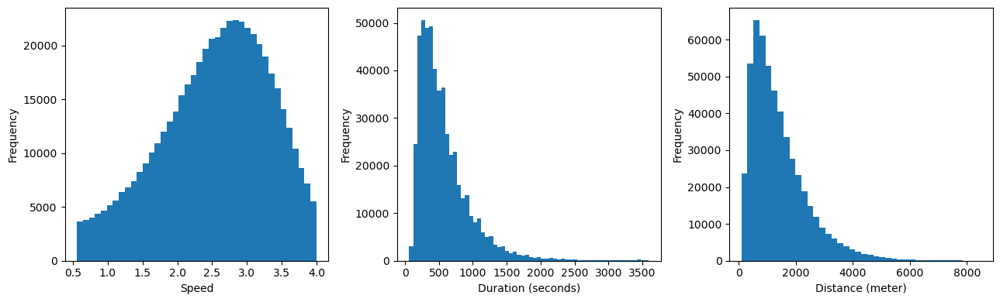

,escooter_distance,escooter_time,speed
count,519337.00,519337.00,519337.00
mean,1413.09,566.35,2.55
std,995.91,391.22,0.78
min,100.04,61.00,0.56
25%,688.42,304.00,2.02
50%,1163.62,463.00,2.63
75%,1869.87,722.00,3.14
max,8497.38,3594.00,4.00


In [129]:
fig, axes = plt.subplots(1, 3, figsize=(13, 4))

axes[0].hist(df_sth['speed'], bins=40)
axes[0].set_xlabel('Speed')
axes[0].set_ylabel('Frequency')

axes[1].hist(df_sth['escooter_time'], bins=60) 
axes[1].set_xlabel('Duration (seconds)')
axes[2].set_ylabel('Frequency')

df_sth['escooter_distance'] = pd.to_numeric(df_sth['escooter_distance'], errors='coerce')
axes[2].hist(df_sth['escooter_distance'], bins=40)
axes[2].set_xlabel('Distance (meter)')
axes[1].set_ylabel('Frequency')

plt.tight_layout()
plt.show()

df_sth[['escooter_distance', 'escooter_time', 'speed']].describe().round(2)

# Weather

##### <mark>Dataset is already filtered for days with little data & days where high precipitation or very low temperatures</mark>

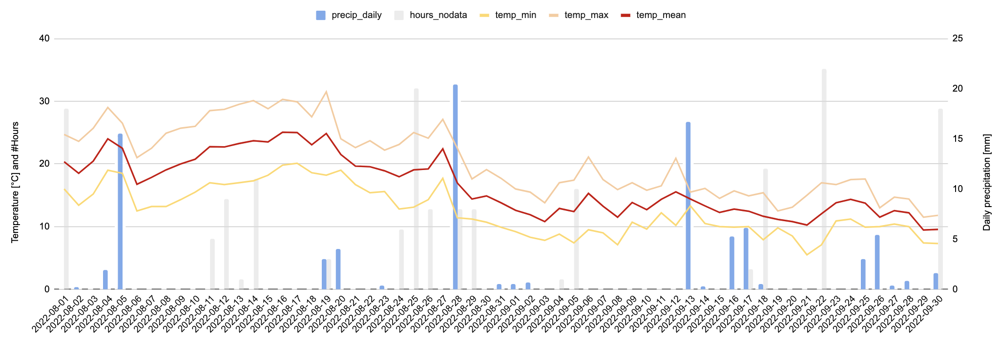

# Functions

In [130]:
def histogram_lines(e, bins):
    plot_dim_before = np.histogram(data_before[e].dropna(), bins, density=True)
    plot_dim_after = np.histogram(data_after[e].dropna(), bins, density=True)

    #get bin centers
    plot_dim_before_l =(plot_dim_before[1][1:] + plot_dim_before[1][:-1])/2
    plot_dim_after_l =(plot_dim_after[1][1:] + plot_dim_after[1][:-1])/2
    
    return plot_dim_before_l, plot_dim_after_l, plot_dim_before, plot_dim_after

def histogram_lines_log(e, bins):
    plot_dim_before = np.histogram(np.log(data_before[e].dropna()), bins, density=True)
    plot_dim_after = np.histogram(np.log(data_after[e].dropna()), bins, density=True)

    #get bin centers
    plot_dim_before_l =(plot_dim_before[1][1:] + plot_dim_before[1][:-1])/2
    plot_dim_after_l =(plot_dim_after[1][1:] + plot_dim_after[1][:-1])/2
    
    return plot_dim_before_l, plot_dim_after_l, plot_dim_before, plot_dim_after

def reg_ttest(dimensions, log_arr):
    df_ttest = pd.DataFrame(columns=dimensions)
    df_ttest['measure'] = ['t-statistic', 'p_ttest']
    df_ttest.set_index('measure', inplace=True)

    for c, i in enumerate(dimensions):
        if log_arr[c] == 1:
            temp_ttest = stats.ttest_ind(np.log(data_before[i].dropna()), np.log(data_after[i].dropna()), equal_var=True)
        else:
            temp_ttest = stats.ttest_ind(data_before[i], data_after[i], equal_var=True)

        df_ttest[i] = [temp_ttest.statistic, temp_ttest.pvalue]

    # Mean and standard deviation of quantities, before and after
    df_ttest.loc['mean_ant'] = data_before[dimensions].mean()
    df_ttest.loc['mean_post'] = data_after[dimensions].mean()
    df_ttest.loc['std_ant'] = data_before[dimensions].std()
    df_ttest.loc['std_post'] = data_after[dimensions].std()
    
    return df_ttest

In [131]:
weekends = ['Friday','Saturday', 'Sunday']
weekdays_before = data_before[~data_before['day'].isin(weekends)]
weekdays_after = data_after[~data_after['day'].isin(weekends)]
fri_before = data_before[data_before['day'].isin(['Friday'])]
fri_after = data_after[data_after['day'].isin(['Friday'])]
weekends = ['Saturday', 'Sunday']
weekends_before = data_before[data_before['day'].isin(weekends)]
weekends_after = data_after[data_after['day'].isin(weekends)]
labels = ['Weekdays (Mon-Thurs)', 'Fridays', 'Weekends']

In [133]:
def pdf_day_mode_plot(dims, log_arr, bins):

    fig, axes = plt.subplots(len(dims), 3, figsize=(13, 3*len(dims)))

    for i, e in enumerate(dims):

        arr_bef = [weekdays_before, fri_before, weekends_before]
        arr_aft = [weekdays_after, fri_after, weekends_after]

        for j in range(3):

            if log_arr[i] == 1:
                #hist
                plot_weekdays_before = np.histogram(np.log(arr_bef[j][e].dropna()), bins, density=True)
                plot_weekdays_after = np.histogram(np.log(arr_aft[j][e].dropna()), bins, density=True)
            else:
                plot_weekdays_before = np.histogram(arr_bef[j][e].dropna(), bins, density=True)
                plot_weekdays_after = np.histogram(arr_aft[j][e].dropna(), bins, density=True)

            #bin centers
            plot_weekdays_before_l =(plot_weekdays_before[1][1:] + plot_weekdays_before[1][:-1])/2
            plot_weekdays_after_l =(plot_weekdays_after[1][1:] + plot_weekdays_after[1][:-1])/2
            
            if len(dims)==1:

                axes[j].plot(plot_weekdays_before_l, plot_weekdays_before[0], label = 'ant')
                axes[j].plot(plot_weekdays_after_l, plot_weekdays_after[0], label = 'post', color='salmon', alpha=0.7)
                axes[j].set_xlabel(e)
                axes[j].set_ylabel('Probability')
                axes[j].legend()
                axes[0].set_title('Weekdays (Mon-Thur)')
                axes[1].set_title('Fridays')
                axes[2].set_title('Weekends (Sat-Sun)')
            else:
                axes[i][j].plot(plot_weekdays_before_l, plot_weekdays_before[0], label = 'ant')
                axes[i][j].plot(plot_weekdays_after_l, plot_weekdays_after[0], label = 'post', color='salmon', alpha=0.7)
                axes[i][j].set_xlabel(e)
                axes[i][j].set_ylabel('Probability')
                axes[i][j].legend()
                axes[0][0].set_title('Weekdays (Mon-Thur)')
                axes[0][1].set_title('Fridays')
                axes[0][2].set_title('Weekends (Sat-Sun)')
    plt.tight_layout()
    plt.show()

    
def ttest_day_mode(dims, arr_log):
    df_ttest = pd.DataFrame(columns=dims)
    df_ttest_WE = pd.DataFrame(columns=dims)
    df_ttest_fri = pd.DataFrame(columns=dims)

    arr = [df_ttest, df_ttest_WE, df_ttest_fri]
    arr_bef = [weekdays_before, weekends_before, fri_before]
    arr_aft = [weekdays_after, weekends_after, fri_after]

    for i in arr:
        i['measure'] = ['t-statistic', 'p_ttest']
        i.set_index('measure', inplace=True)

    for f,j in enumerate(dims):
            for i, e in enumerate(arr):
                speed_ttest = stats.ttest_ind(a=arr_bef[i][j].dropna(), b=arr_aft[i][j].dropna(), equal_var=True)
                e[j] = [speed_ttest.statistic, speed_ttest.pvalue]
                if arr_log[f] == 1:
                    speed_ttest = stats.ttest_ind(a=np.log(arr_bef[i][j].dropna()), b=np.log(arr_aft[i][j].dropna()), equal_var=True)
                    e[j] = [speed_ttest.statistic, speed_ttest.pvalue]

    for i,e in enumerate(arr):

        # Mean and standard deviation of quantities, before and after
        e.loc['mean_ant'] = arr_bef[i][dims].mean()
        e.loc['mean_post'] = arr_aft[i][dims].mean()
        e.loc['std_ant'] = arr_bef[i][dims].std()
        e.loc['std_post'] = arr_aft[i][dims].std()


    scooter_stats_styler = df_ttest.style.set_table_attributes("style='display:inline'").set_caption('Weekdays')
    scooter_fri_stats_styler = df_ttest_fri.style.set_table_attributes("style='display:inline'").set_caption('Fridays')
    scooter_WE_stats_styler = df_ttest_WE.style.set_table_attributes("style='display:inline'").set_caption('Weekends')


    display_html(scooter_stats_styler._repr_html_()+scooter_fri_stats_styler._repr_html_()+scooter_WE_stats_styler._repr_html_(), raw=True)


In [134]:
def create_grid(grid_size):

    xmin, ymin, xmax, ymax= 17.94,59.28,18.18,59.39
    cell_size = grid_size #0.002

    # create the cells in a loop
    grid_cells = []
    for x0 in np.arange(xmin, xmax+cell_size, cell_size ):
        for y0 in np.arange(ymin, ymax+cell_size, cell_size):
            # bounds
            x1 = x0-cell_size
            y1 = y0+cell_size
            grid_cells.append( shapely.geometry.box(x0, y0, x1, y1)  )
    cell = gpd.GeoDataFrame(grid_cells, columns=['geometry'])
    return cell

In [135]:
cell_diff = create_grid(0.002)

def plot_before_after_az(dimensions):
    fig, axes = plt.subplots(len(dimensions),2, figsize=(16,4*len(dimensions)))

    for i in range(2):
        for j,e in enumerate(dimensions): 
            max_scale = max(zone_aggr[0][e].max(), zone_aggr[1][e].max())
            min_scale = max(zone_aggr[0][e].min(), zone_aggr[1][e].min())
            
            if(len(dimensions)>1):
                ax = zone_aggr[i].plot(ax=axes[j][i], column=e, legend=True, alpha=0.7, vmax = max_scale, vmin = min_scale)
                ctx.add_basemap(ax=axes[j][i], crs='EPSG:4326', source=ctx.providers.CartoDB.Positron, alpha=0.5)   
                axes[j][i].set_title(e + (' (Pre-Policy)' if i == 0 else ' (Post-Policy)'))
            else:
                ax = zone_aggr[i].plot(ax=axes[i], column=e, legend=True, alpha=0.7, vmax = max_scale, vmin = min_scale)
                ctx.add_basemap(ax=axes[i], crs='EPSG:4326', source=ctx.providers.CartoDB.Positron, alpha=0.5)   
                axes[i].set_title(e + (' (Pre-Policy)' if i == 0 else ' (Post-Policy)'))
            ax.axis('off')

    return fig, axes


def paired_ttest_az(dimensions):
    df_ttest = pd.DataFrame(columns=dimensions)
    df_ttest['measure'] = ['t-statistic', 'p_ttest']
    df_ttest.set_index('measure', inplace=True)

    for i in dimensions:
        temp_ttest = stats.ttest_rel(zone_aggr[0][i], zone_aggr[1][i], nan_policy='omit')
        df_ttest[i] = [temp_ttest.statistic, temp_ttest.pvalue]

    # Mean and standard deviation of quantities, before and after
    df_ttest.loc['mean_ant'] = zone_aggr[0][dimensions].mean()
    df_ttest.loc['mean_post'] = zone_aggr[1][dimensions].mean()
    df_ttest.loc['std_ant'] = zone_aggr[0][dimensions].std()
    df_ttest.loc['std_post'] = zone_aggr[1][dimensions].std()
    
    return df_ttest
    
    
def plot_differences_az(dimensions):
    
#     cell_diff = pd.DataFrame()
    fig, axes = plt.subplots(len(dimensions),1, figsize=(12,4*len(dimensions)))

    for j,e in enumerate(dimensions): 
        # calculate difference for each zone
        cell_diff[e] = zone_aggr[1][e] - zone_aggr[0][e]
        cell_diff[e] = cell_diff[e].dropna()

        max_scale = max(np.abs(cell_diff[e].min()), np.abs(cell_diff[e].max()))
        divnorm=colors.TwoSlopeNorm(vmin=-max_scale, vcenter=0, vmax=max_scale)
        ax = cell_diff.plot(ax=axes[j], column=e, legend=True, alpha=0.7, cmap='RdYlGn', norm=divnorm)
        ctx.add_basemap(ax=axes[j], crs='EPSG:4326', source=ctx.providers.CartoDB.Positron, alpha=0.5)   
        axes[j].set_title(e + (' - Δ(Post-Pre)'))
        ax.axis('off')
        
    return fig, axes

In [136]:
def throughout_weekdays_plot(dimensions):
    labels = ['Weekdays (Mon-Thurs)', 'Fridays', 'Weekends']
    
    # PDF
    fig, axes = plt.subplots(len(dimensions), 3, figsize=(13, 3*(len(dimensions))))
    arr_bef = [weekdays_before, fri_before, weekends_before]
    arr_aft = [weekdays_after, fri_after, weekends_after]
    
    if(len(dimensions) == 1):
        for j in range(3):

            # for each hour of the day, take mean and avg
            arr_bef[j] = arr_bef[j].assign(hours = lambda x: x.o_time.dt.hour)
            mean_bef = arr_bef[j].groupby('hours')[dimensions[0]].mean()
            std_bef = arr_bef[j].groupby('hours')[dimensions[0]].std()
            axes[j].plot(mean_bef.reset_index().hours, mean_bef, label = 'ant')
            axes[j].fill_between(mean_bef.reset_index().hours, mean_bef-(0.5*std_bef), mean_bef+(0.5*std_bef), alpha=0.2)

            arr_aft[j] = arr_aft[j].assign(hours = lambda x: x.o_time.dt.hour)
            mean_aft = arr_aft[j].groupby('hours')[dimensions[0]].mean()
            std_aft = arr_aft[j].groupby('hours')[dimensions[0]].std()
            axes[j].plot(mean_aft.reset_index().hours, mean_aft, color='salmon', label = 'post')
            axes[j].fill_between(mean_aft.reset_index().hours, mean_aft-(0.5*std_aft), mean_aft+(0.5*std_aft), alpha=0.2, color='salmon')

            axes[j].legend()
            axes[j].set_xlabel('Mean ' + dimensions[0] + ' per hour of day')
            
    
        axes[0].set_title('Weekdays (Mon-Thur)')
        axes[1].set_title('Fridays')
        axes[2].set_title('Weekends (Sat-Sun)')
        
    else:
        for i, e in enumerate(dimensions):
            for j in range(3):

                # for each hour of the day, take mean and avg
                arr_bef[j] = arr_bef[j].assign(hours = lambda x: x.o_time.dt.hour)
                mean_bef = arr_bef[j].groupby('hours')[e].mean()
                std_bef = arr_bef[j].groupby('hours')[e].std()
                axes[i][j].plot(mean_bef.reset_index().hours, mean_bef, label = 'ant')
                axes[i][j].fill_between(mean_bef.reset_index().hours, mean_bef-(0.5*std_bef), mean_bef+(0.5*std_bef), alpha=0.2)

                arr_aft[j] = arr_aft[j].assign(hours = lambda x: x.o_time.dt.hour)
                mean_aft = arr_aft[j].groupby('hours')[e].mean()
                std_aft = arr_aft[j].groupby('hours')[e].std()
                axes[i][j].plot(mean_aft.reset_index().hours, mean_aft, color='salmon', label = 'post')
                axes[i][j].fill_between(mean_aft.reset_index().hours, mean_aft-(0.5*std_aft), mean_aft+(0.5*std_aft), alpha=0.2, color='salmon')

                axes[i][j].legend()

                axes[i][j].set_xlabel('Mean ' + e + ' per hour of day')
                if(i == 0):
                    axes[i][j].set_ylabel('seconds')
                if(i == 1):
                    axes[i][j].set_ylabel('meters')
                if(i == 2):
                    axes[i][j].set_ylabel('m/s')
    
        axes[0][0].set_title('Weekdays (Mon-Thur)')
        axes[0][1].set_title('Fridays')
        axes[0][2].set_title('Weekends (Sat-Sun)')
        
    plt.tight_layout()
    plt.show()

In [137]:
# create geometries
gdf_before = gpd.GeoDataFrame(data_before,geometry=gpd.points_from_xy(data_before['o_lng'],data_before['o_lat']))
gdf_after = gpd.GeoDataFrame(data_after,geometry=gpd.points_from_xy(data_after['o_lng'],data_after['o_lat']))

# set grid parameters
xmin, ymin, xmax, ymax= 17.94,59.28,18.18,59.39
cell_size = 0.002 #ca 450m
    
    
arr_gdf = [gdf_before, gdf_after]
zone_aggr = [0,0]

for i, e in enumerate(arr_gdf):
    # create grid
    cell = create_grid(cell_size)
    merged = gpd.sjoin(e, cell, how='left')
    merged['reduced_time'] = ((merged['P_walk'] * merged['walk_time']) + (merged['P_bike'] * merged['escooter_time']) + (merged['P_PT'] * merged['transit_totaltime']) + (merged['P_car'] * merged['car_time']) + (merged['P_taxi'] * merged['car_time'])) - merged['escooter_time']

    az_aggr = pd.DataFrame()
    # aggregate variables per zone
    az_aggr['demand_total'] = merged.groupby('index_right').count()[['id']]
    az_aggr['demand_dailysumavg'] = merged.groupby(['index_right','Date'])['id'].count().dropna().reset_index().groupby('index_right').mean()['id']

    az_aggr['escooter_distance_avg'] = merged.groupby('index_right')['escooter_distance'].mean()
    az_aggr['escooter_time_avg'] = merged.groupby('index_right')['escooter_time'].mean()
    az_aggr['speed_avg'] = merged.groupby('index_right')['speed'].mean()

    az_aggr['GHG_total'] = merged.groupby('index_right')['GHG'].sum()
    az_aggr['GHG_avg'] = merged.groupby('index_right')['GHG'].mean()
    az_aggr['GHG_dailysumavg'] = merged.groupby(['index_right','Date'])['GHG'].sum().reset_index().groupby('index_right').mean()['GHG']

    az_aggr['P_walk_avg'] =merged.groupby('index_right')['P_walk'].mean()
    az_aggr['P_bike_avg'] =merged.groupby('index_right')['P_bike'].mean()
    az_aggr['P_PT_avg'] =merged.groupby('index_right')['P_PT'].mean()
    az_aggr['P_car_avg'] =merged.groupby('index_right')['P_car'].mean()
    az_aggr['P_taxi_avg'] =merged.groupby('index_right')['P_taxi'].mean()
    
    #'walk_time', 'car_time','transit_totaltime','transit_time', 'transit_walktime'
    az_aggr['T_walk_avg'] =merged.groupby('index_right')['walk_time'].mean()
    az_aggr['T_car_avg'] =merged.groupby('index_right')['car_time'].mean()
    az_aggr['T_transittotal_avg'] =merged.groupby('index_right')['transit_totaltime'].mean()
    az_aggr['T_transitPT_avg'] =merged.groupby('index_right')['transit_time'].mean()
    az_aggr['T_transitwalk_avg'] =merged.groupby('index_right')['transit_walktime'].mean()

    az_aggr['reduced_time_total'] = merged.groupby('index_right')['reduced_time'].sum()
    az_aggr['reduced_time_avg'] = merged.groupby('index_right')['reduced_time'].mean()
    az_aggr['reduced_time_dailysumavg'] = merged.groupby(['index_right','Date'])['reduced_time'].sum().reset_index().groupby('index_right').mean()['reduced_time']

    az_aggr['alternative_time_avg'] = az_aggr['reduced_time_avg'] + az_aggr['escooter_time_avg']
    
    az_aggr['utilisationrate_avg'] = merged.groupby(['index_right','id'])['id'].count().dropna().groupby('index_right').mean() #average utilisation rate
    az_aggr['nunique_id_total'] = merged.groupby(['index_right'])['id'].nunique() # number of unique scooters
    az_aggr['nunique_id_dailysumavg'] =merged.groupby(['index_right','Date'])['id'].nunique().dropna().reset_index().groupby('index_right').mean()['id']
    
    azs = list(az_aggr[az_aggr.demand_total > 30].index)
    
    # filter out zones with less than 30 trips in total
    az_aggr = az_aggr[az_aggr['demand_total']>30] 
    display(az_aggr.head()) 
    print(az_aggr.shape)

    # merge zones with grid coordinates
    for j in az_aggr.columns:
        cell.loc[az_aggr.index, j] = az_aggr[j].values
    
    zone_aggr[i] = cell

,demand_total,demand_dailysumavg,escooter_distance_avg,escooter_time_avg,speed_avg,GHG_total,GHG_avg,GHG_dailysumavg,P_walk_avg,P_bike_avg,...,T_transittotal_avg,T_transitPT_avg,T_transitwalk_avg,reduced_time_total,reduced_time_avg,reduced_time_dailysumavg,alternative_time_avg,utilisationrate_avg,nunique_id_total,nunique_id_dailysumavg
index_right,,,,,,,,,,,,,,,,,,,,,
217,36,2.000000,1522.638571,522.111111,2.944315,-2235.931585,-62.109211,-124.218421,0.586213,0.051618,...,1101.861111,246.666667,855.194444,27494.190838,785.548310,1527.455047,1307.659421,1.058824,34,1.888889
385,42,2.210526,872.607568,405.952381,1.938136,-1700.226746,-40.481589,-89.485618,0.660966,0.028200,...,792.500000,164.285714,628.214286,21468.360957,523.618560,1129.913735,929.570941,1.050000,40,2.157895
388,41,2.157895,1556.629148,532.975610,3.036207,-3049.122661,-74.368845,-160.480140,0.495571,0.060161,...,982.682927,238.536585,744.146341,22521.664171,577.478568,1185.350746,1110.454178,1.078947,38,2.157895
441,381,18.142857,1179.489748,460.307087,2.671556,-16498.397644,-43.302881,-785.637983,0.630017,0.039526,...,938.081365,221.574803,716.506562,230507.876100,638.525973,10976.565529,1098.833059,1.327526,287,15.952381
447,57,2.850000,1230.274277,592.631579,2.540167,-1737.506474,-30.482570,-86.875324,0.595052,0.031759,...,1002.438596,289.473684,712.964912,22873.128710,476.523515,1143.656436,1069.155094,1.325581,43,2.450000


(1237, 25)


,demand_total,demand_dailysumavg,escooter_distance_avg,escooter_time_avg,speed_avg,GHG_total,GHG_avg,GHG_dailysumavg,P_walk_avg,P_bike_avg,...,T_transittotal_avg,T_transitPT_avg,T_transitwalk_avg,reduced_time_total,reduced_time_avg,reduced_time_dailysumavg,alternative_time_avg,utilisationrate_avg,nunique_id_total,nunique_id_dailysumavg
index_right,,,,,,,,,,,,,,,,,,,,,
160,39,2.166667,1817.527640,682.461538,2.800219,-3510.263841,-90.006765,-195.014658,0.516195,0.038576,...,899.615385,236.923077,662.692308,16423.727257,421.121212,912.429292,1103.582750,1.114286,35,2.055556
441,237,11.285714,1014.778687,398.805907,2.685254,-11123.570873,-46.934898,-529.693851,0.668739,0.042767,...,901.126582,203.797468,697.329114,129747.304204,581.826476,6178.443057,980.632383,1.260638,188,10.571429
448,53,2.944444,1460.961596,492.528302,2.995699,-3599.781120,-67.920398,-199.987840,0.562146,0.067219,...,958.471698,332.830189,625.641509,34603.393739,678.497916,1922.410763,1171.026218,1.104167,48,2.888889
498,162,8.100000,1097.832557,431.086420,2.672841,-7589.756304,-46.850348,-379.487815,0.636143,0.040877,...,895.209877,176.296296,718.913580,86927.442362,568.153218,4346.372118,999.239638,1.208955,134,7.300000
499,37,2.176471,1071.961286,360.864865,3.125478,-2189.538539,-59.176717,-128.796385,0.617818,0.042683,...,951.648649,178.378378,773.270270,21398.747442,629.374925,1258.749850,990.239790,1.027778,36,2.176471


(1007, 25)


In [139]:
# create geometries, for destination-based
gdf_before_d = gpd.GeoDataFrame(data_before,geometry=gpd.points_from_xy(data_before['d_lng'],data_before['d_lat']))
gdf_after_d = gpd.GeoDataFrame(data_after,geometry=gpd.points_from_xy(data_after['d_lng'],data_after['d_lat']))

# set grid parameters
xmin, ymin, xmax, ymax= 17.94,59.28,18.18,59.39

cell_size = 0.002
    
arr_gdf_d = [gdf_before_d, gdf_after_d]
zone_aggr_dest = [0,0]

for i, e in enumerate(arr_gdf_d):
    # create grid
    cell = create_grid(cell_size)
    merged = gpd.sjoin(e, cell, how='left')
    merged['reduced_time'] = ((merged['P_walk'] * merged['walk_time']) + (merged['P_bike'] * merged['escooter_time']) + (merged['P_PT'] * merged['transit_totaltime']) + (merged['P_car'] * merged['car_time']) + (merged['P_taxi'] * merged['car_time'])) - merged['escooter_time']

    az_aggr = pd.DataFrame()
    # aggregate variables per zone
    az_aggr['demand_total'] = merged.groupby('index_right').count()[['id']]
    az_aggr['demand_dailysumavg'] = merged.groupby(['index_right','Date'])['id'].count().dropna().reset_index().groupby('index_right').mean()['id']

    az_aggr['escooter_distance_avg'] = merged.groupby('index_right')['escooter_distance'].mean()
    az_aggr['escooter_time_avg'] = merged.groupby('index_right')['escooter_time'].mean()
    az_aggr['speed_avg'] = merged.groupby('index_right')['speed'].mean()

    az_aggr['utilisationrate_avg'] = merged.groupby(['index_right','id'])['id'].count().dropna().groupby('index_right').mean() #average utilisation rate
    az_aggr['nunique_id_total'] = merged.groupby(['index_right'])['id'].nunique() # number of unique scooters
    az_aggr['nunique_id_dailysumavg'] =merged.groupby(['index_right','Date'])['id'].nunique().dropna().reset_index().groupby('index_right').mean()['id']
    
    azs = list(az_aggr[az_aggr.demand_total > 30].index)
    
    # filter out zones with less than 30 trips in total
    az_aggr = az_aggr[az_aggr['demand_total']>30] 
    display(az_aggr.head()) 
    print(az_aggr.shape)

    # merge zones with grid coordinates
    for j in az_aggr.columns:
        cell.loc[az_aggr.index, j] = az_aggr[j].values
    
    zone_aggr_dest[i] = cell

,demand_total,demand_dailysumavg,escooter_distance_avg,escooter_time_avg,speed_avg,utilisationrate_avg,nunique_id_total,nunique_id_dailysumavg
index_right,,,,,,,,
159,33,1.736842,1896.821715,661.666667,3.080703,1.178571,28,1.526316
217,50,2.777778,1570.697998,620.660000,2.743590,1.190476,42,2.666667
272,34,2.615385,1078.401308,525.852941,2.256059,1.062500,32,2.615385
385,53,2.650000,607.343312,317.396226,1.960859,1.127660,47,2.450000
388,38,2.111111,1269.113976,429.868421,2.986618,1.027027,37,2.055556


(1246, 8)


,demand_total,demand_dailysumavg,escooter_distance_avg,escooter_time_avg,speed_avg,utilisationrate_avg,nunique_id_total,nunique_id_dailysumavg
index_right,,,,,,,,
160,37,1.947368,1615.791596,645.702703,2.708228,1.088235,34,1.894737
388,32,2.285714,1151.813446,403.875000,2.895982,1.103448,29,2.285714
441,258,12.285714,1112.579022,463.821705,2.568316,1.316327,196,11.238095
448,41,2.411765,1469.741784,603.146341,2.401564,1.078947,38,2.352941
498,163,7.761905,1099.551261,436.558282,2.633843,1.189781,137,7.142857


(1014, 8)


# Demand

/var/folders/z2/kf3r9tts47g2ll86n2gd20p00000gn/T/ipykernel_29694/243023560.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_datecount['o_time'] = df_datecount['o_time'].apply(lambda x: x.strftime('%Y-%m-%d'))


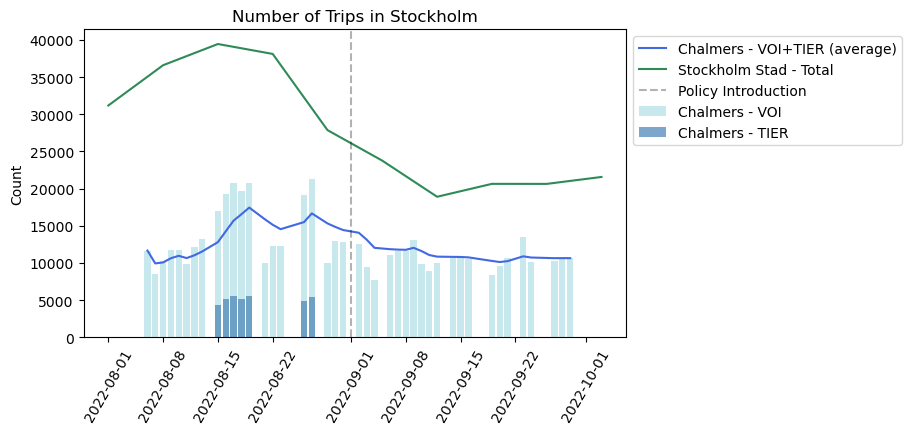

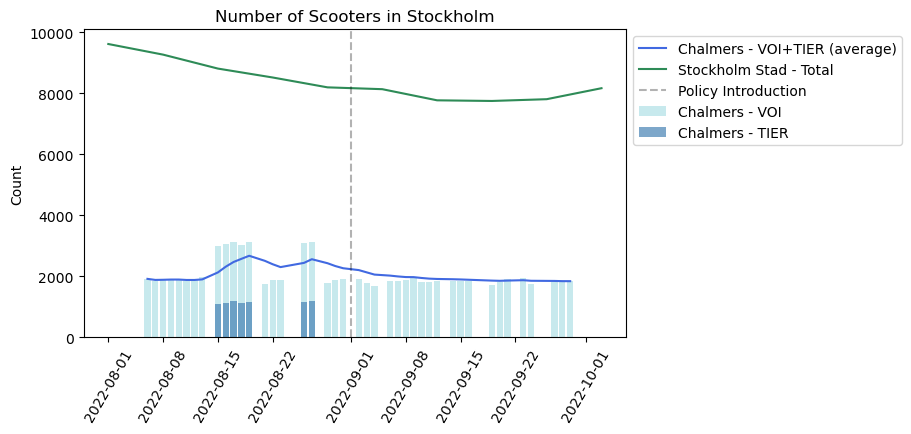

In [140]:
sth_stad_data = pd.read_csv('/Users/marinawiemers/sms_research/sth_stad_scooter_aug_sep_2022.csv')
df_datecount = df_sth[['o_time', 'id']]
df_datecount['o_time'] = df_datecount['o_time'].apply(lambda x: x.strftime('%Y-%m-%d'))
daily_trips = df_datecount.groupby(['o_time'])['id'].size().reset_index()
daily_scoot = df_datecount.groupby(['o_time'])['id'].nunique().reset_index()

df_datecount_t = df_sth[df_sth.type=='tier'][['o_time', 'id']]
df_datecount_t['o_time'] = df_datecount_t['o_time'].apply(lambda x: x.strftime('%Y-%m-%d'))
daily_trips_t = df_datecount_t.groupby(['o_time'])['id'].size().reset_index()
daily_scoot_t = df_datecount_t.groupby(['o_time'])['id'].nunique().reset_index()

plt.figure(figsize=(7,4))
date_1 = [dt.datetime.strptime(d,'%Y-%m-%d').date() for d in sth_stad_data.Date]
date_2 = [dt.datetime.strptime(d,'%Y-%m-%d').date() for d in daily_trips.o_time]
date_3 = [dt.datetime.strptime(d,'%Y-%m-%d').date() for d in daily_scoot.o_time]
date_2_t = [dt.datetime.strptime(d,'%Y-%m-%d').date() for d in daily_trips_t.o_time]
date_3_t = [dt.datetime.strptime(d,'%Y-%m-%d').date() for d in daily_scoot_t.o_time]

plt.plot(date_2, daily_trips.id.ewm(com=4).mean(), label='Chalmers - VOI+TIER (average)', color='royalblue')
plt.bar(date_2, daily_trips.id, label='Chalmers - VOI', alpha=0.7, color='powderblue')
plt.bar(date_2_t, daily_trips_t.id, label='Chalmers - TIER', alpha=0.7, color='steelblue')
plt.plot(date_1, sth_stad_data.num_trips, label='Stockholm Stad - Total', color='seagreen')

plt.axvline(x = dt.datetime.strptime('2022-09-01','%Y-%m-%d').date(), color = 'black', label = 'Policy Introduction', alpha=0.3, linestyle='dashed')
plt.ylabel('Count')
plt.legend(bbox_to_anchor=(1, 1))
plt.xticks(rotation = 60)
plt.title('Number of Trips in Stockholm')
plt.show()

plt.figure(figsize=(7,4))

plt.plot(date_3, daily_scoot.id.ewm(com=5).mean(), label='Chalmers - VOI+TIER (average)', color='royalblue')
plt.bar(date_3, daily_scoot.id, label='Chalmers - VOI', alpha=0.7, color='powderblue')
plt.bar(date_3_t, daily_scoot_t.id, label='Chalmers - TIER', alpha=0.7, color='steelblue')
plt.plot(date_1, sth_stad_data.num_vehicle, label='Stockholm Stad - Total', color='seagreen')

plt.axvline(x = dt.datetime.strptime('2022-09-01','%Y-%m-%d').date(), color = 'black', label = 'Policy Introduction', alpha=0.3, linestyle='dashed')
plt.ylabel('Count')
plt.legend(bbox_to_anchor=(1, 1))
plt.xticks(rotation = 60)
plt.title('Number of Scooters in Stockholm')
plt.show()


,before,after
count,21.0000,21.0000
mean,2276.3333,1836.1429
std,583.8966,65.1393
min,1755.0000,1694.0000
25%,1879.0000,1811.0000
50%,1909.0000,1839.0000
75%,3019.0000,1862.0000
max,3133.0000,1960.0000


/var/folders/z2/kf3r9tts47g2ll86n2gd20p00000gn/T/ipykernel_29694/2301191364.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_before['isodate'] = data_before['o_time'].dt.normalize()
/var/folders/z2/kf3r9tts47g2ll86n2gd20p00000gn/T/ipykernel_29694/2301191364.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_after['isodate'] = data_after['o_time'].dt.normalize()


,daily_scooter_amount
measure,
t-statistic,3.4334
p_ttest,0.0014
mean_ant,2276.3333
mean_post,1836.1429
std_ant,583.8966
std_post,65.1393


[[1.54274802e-13]]
[[-3.6612957e-15]]


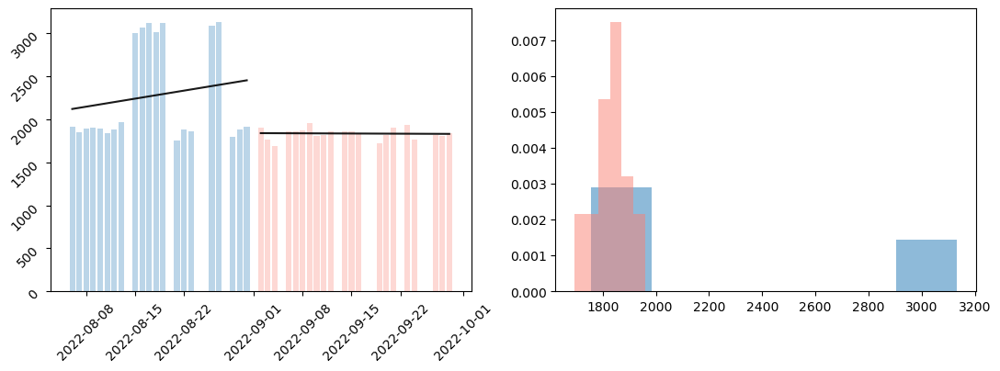

In [176]:
scooternumber_stats = pd.DataFrame(data_before.groupby(['Date']).id.nunique().describe()).rename(columns={'id':'before'})
scooternumber_stats = pd.concat([scooternumber_stats,pd.DataFrame(data_after.groupby(['Date']).id.nunique().describe())], axis=1)
scooternumber_stats = scooternumber_stats.rename(columns={'id': 'after'})
display(scooternumber_stats)

data_before['isodate'] = data_before['o_time'].dt.normalize()
data_after['isodate'] = data_after['o_time'].dt.normalize()

# Overview table
df_ttest = pd.DataFrame(columns=['daily_scooter_amount'])
df_ttest['measure'] = ['t-statistic', 'p_ttest']
df_ttest.set_index('measure', inplace=True)
temp_ttest = stats.ttest_ind(a=data_before.groupby(['isodate']).id.nunique().reset_index().id, b=data_after.groupby(['isodate']).id.nunique().reset_index().id, equal_var=True)
df_ttest['daily_scooter_amount'] = [temp_ttest.statistic, temp_ttest.pvalue]
df_ttest.loc['mean_ant'] = data_before.groupby(['isodate']).id.nunique().reset_index().id.mean()
df_ttest.loc['mean_post'] = data_after.groupby(['isodate']).id.nunique().reset_index().id.mean()
df_ttest.loc['std_ant'] = data_before.groupby(['isodate']).id.nunique().reset_index().id.std()
df_ttest.loc['std_post'] = data_after.groupby(['isodate']).id.nunique().reset_index().id.std()
display(df_ttest)


X = data_before.groupby(['isodate']).id.nunique().reset_index().isodate.values.reshape(-1, 1)
Y = data_before.groupby(['isodate']).id.nunique().reset_index().id.values.reshape(-1, 1)
regr = LinearRegression()
regr.fit(X, Y)

X_p = data_after.groupby(['isodate']).id.nunique().reset_index().isodate.values.reshape(-1, 1)
Y_p = data_after.groupby(['isodate']).id.nunique().reset_index().id.values.reshape(-1, 1) 
regr_p = LinearRegression()
regr_p.fit(X_p, Y_p)

fig, axes = plt.subplots(1, 2, figsize=(13, 4))

axes[0].bar(data_before.groupby(['isodate']).id.nunique().reset_index().isodate, data_before.groupby(['isodate']).id.nunique().reset_index().id, alpha=0.3)
axes[0].bar(data_after.groupby(['isodate']).id.nunique().reset_index().isodate, data_after.groupby(['isodate']).id.nunique().reset_index().id, alpha=0.3, color='salmon')
axes[0].plot(X_p, regr_p.predict(X_p.astype(float).reshape(-1, 1)), color='black', alpha=0.9)
axes[0].plot(X, regr.predict(X.astype(float).reshape(-1, 1)), color='black', alpha=0.9)
axes[0].tick_params(labelrotation=45)
print(regr.coef_)
print(regr_p.coef_)

axes[1].hist(data_before.groupby(['isodate']).id.nunique(), density=True,bins=6, alpha=0.5, label='ant' )
axes[1].hist(data_after.groupby(['isodate']).id.nunique(), density=True,bins=6, color='salmon', alpha=0.5, label='post'  )
plt.show()


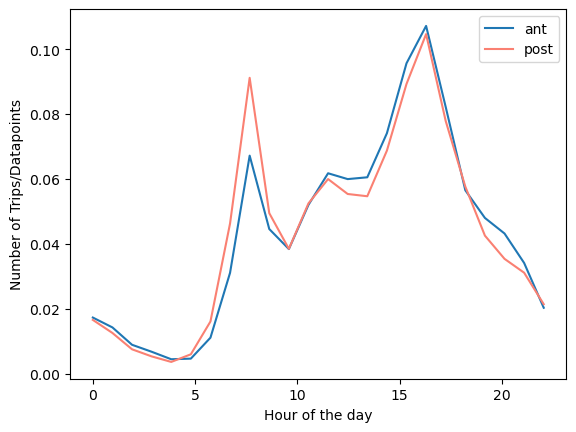

In [141]:
plot_xdays_before = np.histogram(data_before.o_time.dt.hour, 24, density=True)
plot_xdays_after = np.histogram(data_after.o_time.dt.hour, 24, density=True)

plt.plot(plot_xdays_before[1][:-1], plot_xdays_before[0], label = 'ant')
plt.plot(plot_xdays_after[1][:-1], plot_xdays_after[0], label = 'post', color='salmon')
plt.xlabel('Hour of the day')
plt.ylabel('Number of Trips/Datapoints')
plt.legend()
plt.show()

In [142]:
# average number of trips per hour
print(data_before.groupby([data_before.o_time.dt.hour, 'Date']).size().reset_index()[0].mean())
print(data_after.groupby([data_after.o_time.dt.hour, 'Date']).size().reset_index()[0].mean())        

# average number of trips per day
print(data_before.groupby(['Date']).size().mean())
print(data_after.groupby(['Date']).size().mean())

632.9659574468085
441.03976143141153
14166.380952380952
10563.952380952382


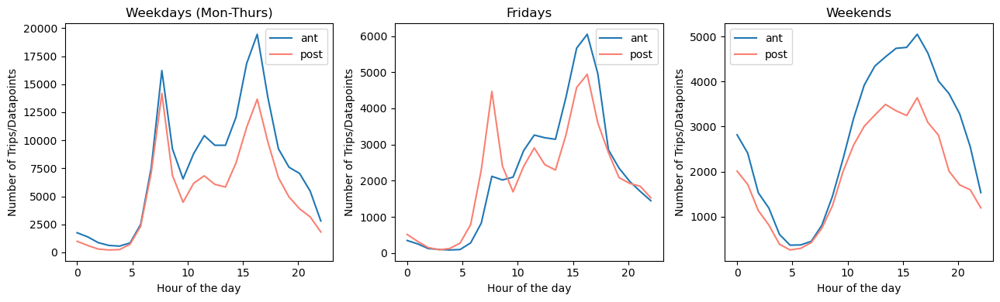

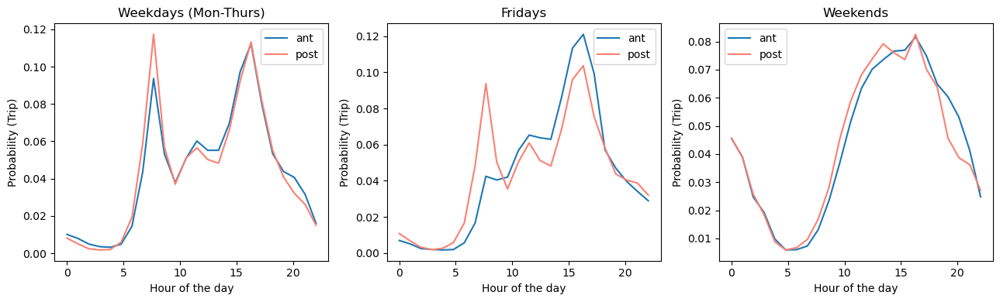

In [143]:
arr_bef = [weekdays_before, fri_before, weekends_before]
arr_aft = [weekdays_after, fri_after, weekends_after]

# Histogram
fig, axes = plt.subplots(1, 3, figsize=(13, 4))
for i, e in enumerate(arr_bef):
    
    plot_xdays_before = np.histogram(arr_bef[i].o_time.dt.hour, 24)
    plot_xdays_after = np.histogram(arr_aft[i].o_time.dt.hour, 24)

    axes[i].plot(plot_xdays_before[1][:-1], plot_xdays_before[0], label = 'ant')
    axes[i].plot(plot_xdays_after[1][:-1], plot_xdays_after[0], label = 'post', color='salmon')
    axes[i].set_xlabel('Hour of the day')
    axes[i].set_ylabel('Number of Trips/Datapoints')
    axes[i].set_title(labels[i])
    axes[i].legend()

plt.tight_layout()
plt.show()

# PDF
fig, axes = plt.subplots(1, 3, figsize=(13, 4))
for i, e in enumerate(arr_bef):
    
    plot_xdays_before = np.histogram(arr_bef[i].o_time.dt.hour, 24, density=True)
    plot_xdays_after = np.histogram(arr_aft[i].o_time.dt.hour, 24, density=True)

    axes[i].plot(plot_xdays_before[1][:-1], plot_xdays_before[0], label = 'ant')
    axes[i].plot(plot_xdays_after[1][:-1], plot_xdays_after[0], label = 'post', color='salmon')
    axes[i].set_xlabel('Hour of the day')
    axes[i].set_ylabel('Probability (Trip)')
    axes[i].set_title(labels[i])
    axes[i].legend()

plt.tight_layout()
plt.show()

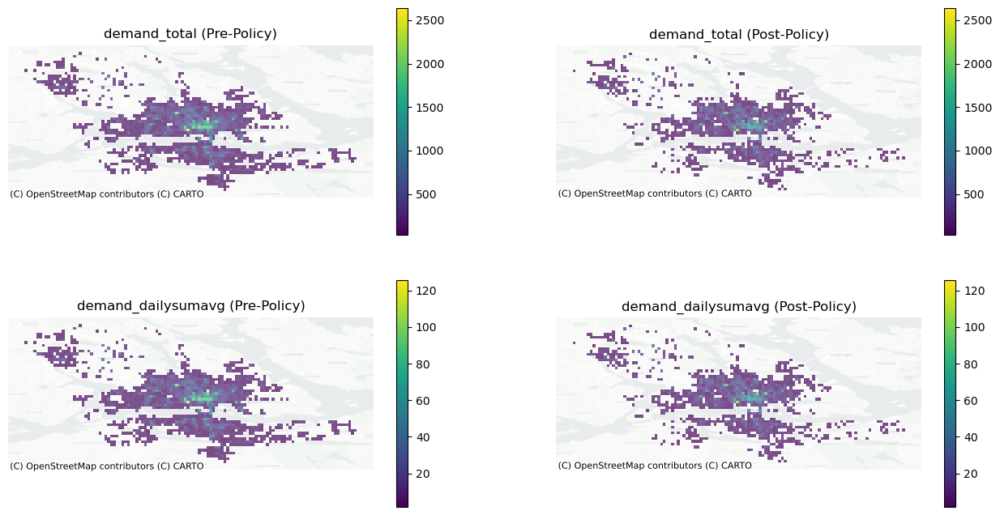

,demand_total,demand_dailysumavg
measure,,
t-statistic,15.3322,15.4474
p_ttest,0.0000,0.0000
mean_ant,234.5546,11.3612
mean_post,213.0109,10.2807
std_ant,286.5091,13.5414
std_post,244.5938,11.5659


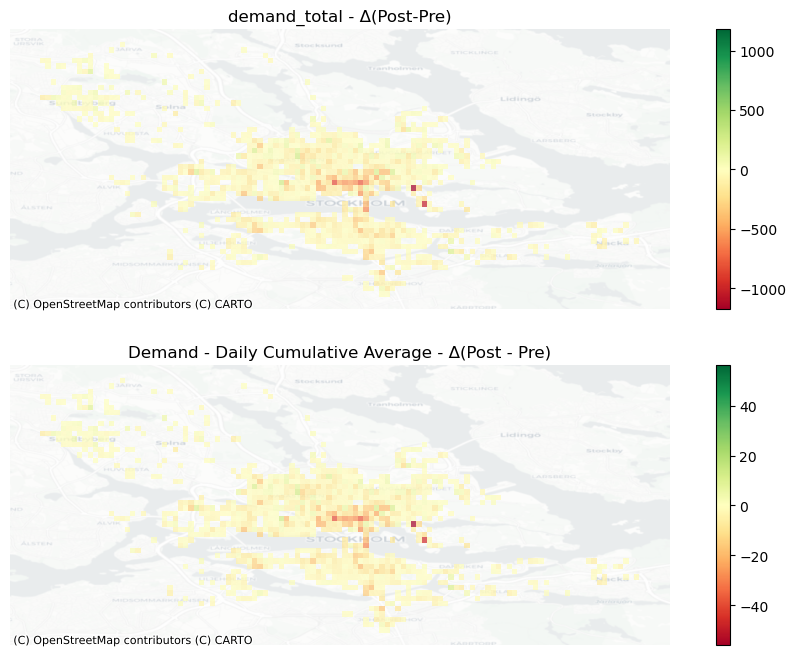

In [144]:
dims = ['demand_total','demand_dailysumavg']

a,b = plot_before_after_az(dims)
plt.show()

ttest_traveltime = paired_ttest_az(dims)
display(ttest_traveltime.round(4))

a, b = plot_differences_az(dims)
b[1].set_title('Demand - Daily Cumulative Average - Δ(Post - Pre)')
plt.show()

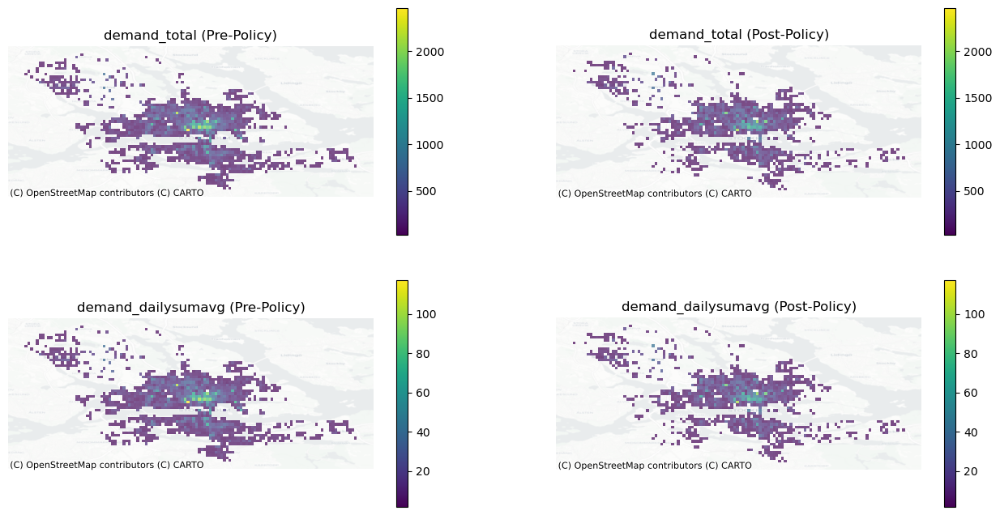

,demand_total,demand_dailysumavg
measure,,
t-statistic,15.5580,15.6590
p_ttest,0.0000,0.0000
mean_ant,233.0353,11.2855
mean_post,211.3590,10.2051
std_ant,281.5116,13.3017
std_post,243.6361,11.5198


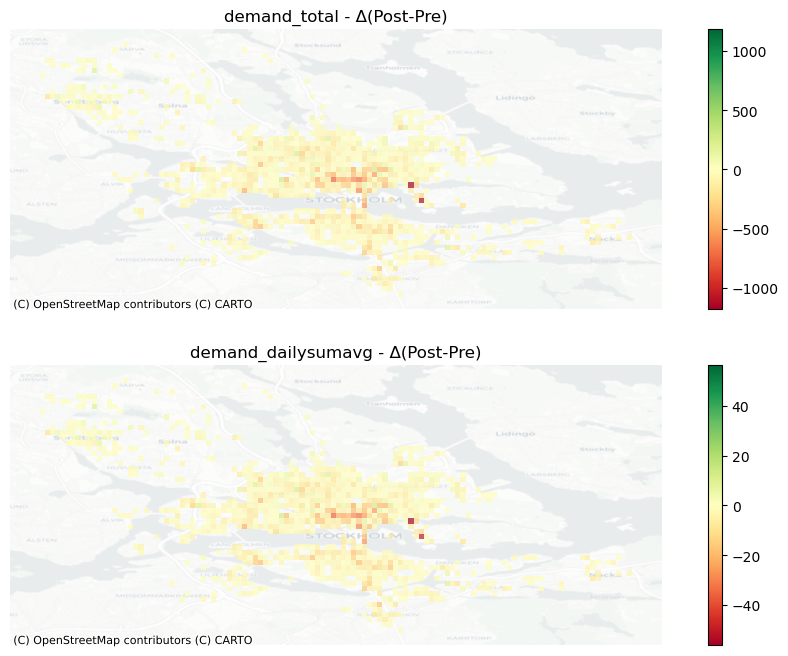

In [146]:
dimensions = ['demand_total','demand_dailysumavg']

cell_diff = create_grid(0.002)

fig, axes = plt.subplots(len(dimensions),2, figsize=(16,4*len(dimensions)))

for i in range(2):
    for j,e in enumerate(dimensions): 
        max_scale = max(zone_aggr_dest[0][e].max(), zone_aggr_dest[1][e].max())
        min_scale = max(zone_aggr_dest[0][e].min(), zone_aggr_dest[1][e].min())

        if(len(dimensions)>1):
            ax = zone_aggr_dest[i].plot(ax=axes[j][i], column=e, legend=True, alpha=0.7, vmax = max_scale, vmin = min_scale)
            ctx.add_basemap(ax=axes[j][i], crs='EPSG:4326', source=ctx.providers.CartoDB.Positron, alpha=0.5)   
            axes[j][i].set_title(e + (' (Pre-Policy)' if i == 0 else ' (Post-Policy)'))
        else:
            ax = zone_aggr_dest[i].plot(ax=axes[i], column=e, legend=True, alpha=0.7, vmax = max_scale, vmin = min_scale)
            ctx.add_basemap(ax=axes[i], crs='EPSG:4326', source=ctx.providers.CartoDB.Positron, alpha=0.5)   
            axes[i].set_title(e + (' (Pre-Policy)' if i == 0 else ' (Post-Policy)'))
        ax.axis('off')
plt.show()


df_ttest = pd.DataFrame(columns=dimensions)
df_ttest['measure'] = ['t-statistic', 'p_ttest']
df_ttest.set_index('measure', inplace=True)

for i in dimensions:
    temp_ttest = stats.ttest_rel(zone_aggr_dest[0][i], zone_aggr_dest[1][i], nan_policy='omit')
    df_ttest[i] = [temp_ttest.statistic, temp_ttest.pvalue]

# Mean and standard deviation of quantities, before and after
df_ttest.loc['mean_ant'] = zone_aggr_dest[0][dimensions].mean()
df_ttest.loc['mean_post'] = zone_aggr_dest[1][dimensions].mean()
df_ttest.loc['std_ant'] = zone_aggr_dest[0][dimensions].std()
df_ttest.loc['std_post'] = zone_aggr_dest[1][dimensions].std()
display(df_ttest.round(4))
    
    
fig, axes = plt.subplots(len(dimensions),1, figsize=(12,4*len(dimensions)))

for j,e in enumerate(dimensions): 
    # calculate difference for each zone
    cell_diff[e] = zone_aggr_dest[1][e] - zone_aggr_dest[0][e]
    cell_diff[e] = cell_diff[e].dropna()

    max_scale = max(np.abs(cell_diff[e].min()), np.abs(cell_diff[e].max()))
    divnorm=colors.TwoSlopeNorm(vmin=-max_scale, vcenter=0, vmax=max_scale)
    ax = cell_diff.plot(ax=axes[j], column=e, legend=True, alpha=0.7, cmap='RdYlGn', norm=divnorm)
    ctx.add_basemap(ax=axes[j], crs='EPSG:4326', source=ctx.providers.CartoDB.Positron, alpha=0.5)   
    axes[j].set_title(e + (' - Δ(Post-Pre)'))
    ax.axis('off')
plt.show()

# Trip Distance, Duration, and Speed

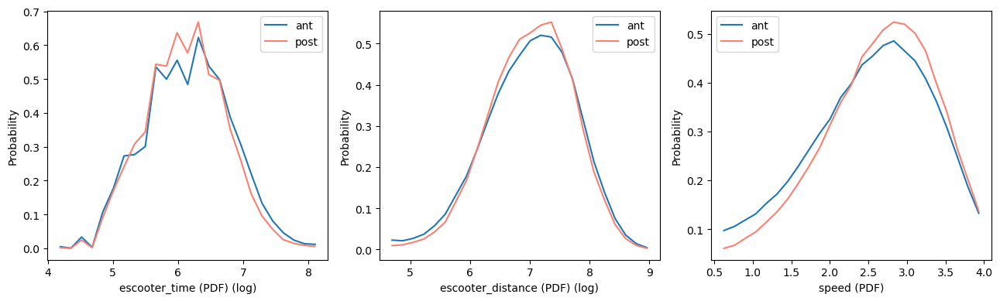

,escooter_time,escooter_distance,speed
measure,,,
t-statistic,24.9397,-2.8707,-43.9661
p_ttest,0.0000,0.0041,0.0000
mean_ant,583.9136,1427.0908,2.5042
mean_post,542.7868,1394.3047,2.6006
std_ant,412.8818,1025.1557,0.8010
std_post,358.7943,954.9738,0.7538


In [147]:
fig, axes = plt.subplots(1,3, figsize=(13,4))

freq_plots_columns = ['escooter_time', 'escooter_distance','speed']
arr_log = [1,1,0]

for i, e in enumerate(freq_plots_columns):
    
    if e == 'speed':
        plot_dim_before_l, plot_dim_after_l, plot_dim_before, plot_dim_after = histogram_lines(e, 25)
    else:
        plot_dim_before_l, plot_dim_after_l, plot_dim_before, plot_dim_after = histogram_lines_log(e, 25)
        
    axes[i].plot(plot_dim_before_l, plot_dim_before[0], label = 'ant')
    axes[i].plot(plot_dim_after_l, plot_dim_after[0], label = 'post', color='salmon')
    axes[i].set_xlabel(e+' (PDF)' + (' (log)' if arr_log[i] == 1 else ''))
    axes[i].set_ylabel('Probability')
    axes[i].legend()

plt.tight_layout()
plt.show()

display(reg_ttest(freq_plots_columns, arr_log).round(4))

In [148]:
data_before[['escooter_time', 'escooter_distance', 'speed']].describe()

,escooter_time,escooter_distance,speed
count,297494.000000,297494.000000,297494.000000
mean,583.913585,1427.090839,2.504206
std,412.881807,1025.155685,0.801017
min,61.000000,100.042755,0.555619
25%,304.000000,679.463094,1.957457
50%,486.000000,1168.577862,2.586999
75%,738.000000,1899.434912,3.118705
max,3594.000000,8497.375682,3.999997


In [149]:
data_after[['escooter_time', 'escooter_distance', 'speed']].describe()

,escooter_time,escooter_distance,speed
count,221843.000000,221843.000000,221843.000000
mean,542.786750,1394.304697,2.600554
std,358.794296,954.973798,0.753806
min,61.000000,100.063685,0.555590
25%,304.000000,699.962226,2.110590
50%,458.000000,1157.187159,2.684715
75%,686.000000,1833.228688,3.170587
max,3585.000000,8494.180520,3.999981


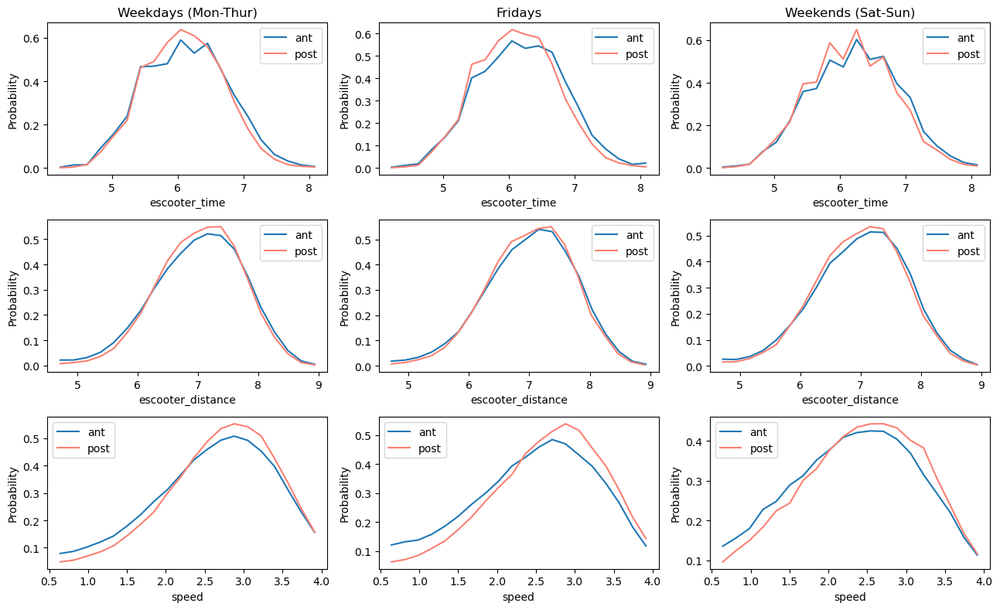

,escooter_time,escooter_distance,speed
measure,,,
t-statistic,13.666620,-5.520627,-31.934279
p_ttest,0.000000,0.000000,0.000000
mean_ant,561.396195,1431.761628,2.581723
mean_post,527.416168,1405.187380,2.670337
std_ant,389.790924,1025.321470,0.777942
std_post,339.225699,950.432002,0.723849
,escooter_time,escooter_distance,speed
measure,,,
t-statistic,18.494997,-0.424895,-29.748773


In [150]:
fig, axes = plt.subplots(3, 3, figsize=(13, 8))

weekends = ['Friday','Saturday', 'Sunday']
dims = ['escooter_time', 'escooter_distance', 'speed']

weekdays_before = data_before[~data_before['day'].isin(weekends)]
weekdays_after = data_after[~data_after['day'].isin(weekends)]

weekends = ['Saturday', 'Sunday']
weekends_before = data_before[data_before['day'].isin(weekends)]
weekends_after = data_after[data_after['day'].isin(weekends)]

fri_before = data_before[data_before['day'].isin(['Friday'])]
fri_after = data_after[data_after['day'].isin(['Friday'])]

for i, e in enumerate(dims):
    
    arr_bef = [weekdays_before, fri_before, weekends_before, fri_before, ]
    arr_aft = [weekdays_after, fri_after, weekends_after]
    
    for j in range(3):
        #hist
        if i == 2:
            plot_weekdays_before = np.histogram(arr_bef[j][e], 20, density=True)
            plot_weekdays_after = np.histogram(arr_aft[j][e], 20, density=True)
        else:
            plot_weekdays_before = np.histogram(np.log(arr_bef[j][e]), 20, density=True)
            plot_weekdays_after = np.histogram(np.log(arr_aft[j][e]), 20, density=True)
        #bin centers
        plot_weekdays_before_l =(plot_weekdays_before[1][1:] + plot_weekdays_before[1][:-1])/2
        plot_weekdays_after_l =(plot_weekdays_after[1][1:] + plot_weekdays_after[1][:-1])/2
        
        axes[i][j].plot(plot_weekdays_before_l, plot_weekdays_before[0], label = 'ant')
        axes[i][j].plot(plot_weekdays_after_l, plot_weekdays_after[0], label = 'post', color='salmon')
        axes[i][j].set_xlabel(e)
        axes[i][j].set_ylabel('Probability')
        axes[i][j].legend()
    
    
axes[0][0].set_title('Weekdays (Mon-Thur)')
axes[0][1].set_title('Fridays')
axes[0][2].set_title('Weekends (Sat-Sun)')
plt.tight_layout()
plt.show()

df_ttest = pd.DataFrame(columns=dims)
df_ttest_WE = pd.DataFrame(columns=dims)
df_ttest_fri = pd.DataFrame(columns=dims)

arr = [df_ttest, df_ttest_WE, df_ttest_fri]
arr_bef = [weekdays_before, weekends_before, fri_before]
arr_aft = [weekdays_after, weekends_after, fri_after]

for i in arr:
    i['measure'] = ['t-statistic', 'p_ttest']
    i.set_index('measure', inplace=True)
        
for j in dims:
        for i, e in enumerate(arr):
            speed_ttest = stats.ttest_ind(a=np.log(arr_bef[i][j].dropna()), b=np.log(arr_aft[i][j].dropna()), equal_var=True)
            if(j == 'speed'):
                speed_ttest = stats.ttest_ind(a=arr_bef[i][j].dropna(), b=arr_aft[i][j].dropna(), equal_var=True)
            e[j] = [speed_ttest.statistic, speed_ttest.pvalue]

for i,e in enumerate(arr):
    
    # Mean and standard deviation of quantities, before and after
    e.loc['mean_ant'] = arr_bef[i][dims].mean()
    e.loc['mean_post'] = arr_aft[i][dims].mean()
    e.loc['std_ant'] = arr_bef[i][dims].std()
    e.loc['std_post'] = arr_aft[i][dims].std()
    

scooter_stats_styler = df_ttest.style.set_table_attributes("style='display:inline'").set_caption('Weekdays')
scooter_fri_stats_styler = df_ttest_fri.style.set_table_attributes("style='display:inline'").set_caption('Fridays')
scooter_WE_stats_styler = df_ttest_WE.style.set_table_attributes("style='display:inline'").set_caption('Weekends')

display_html(scooter_stats_styler._repr_html_()+scooter_fri_stats_styler._repr_html_()+scooter_WE_stats_styler._repr_html_(), raw=True)



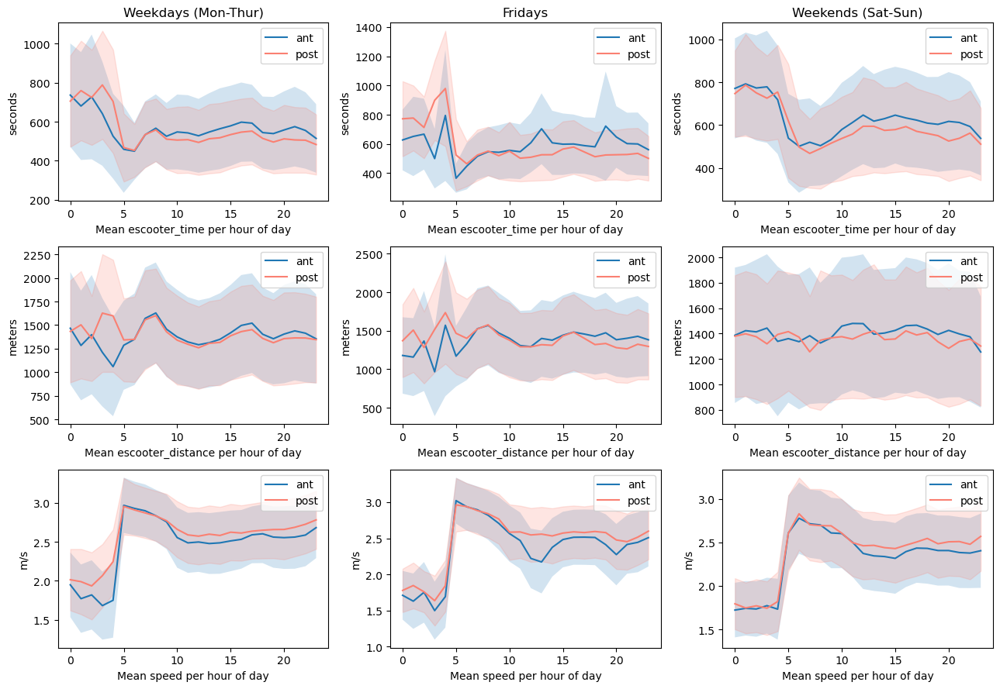

In [151]:
throughout_weekdays_plot(['escooter_time', 'escooter_distance', 'speed'])

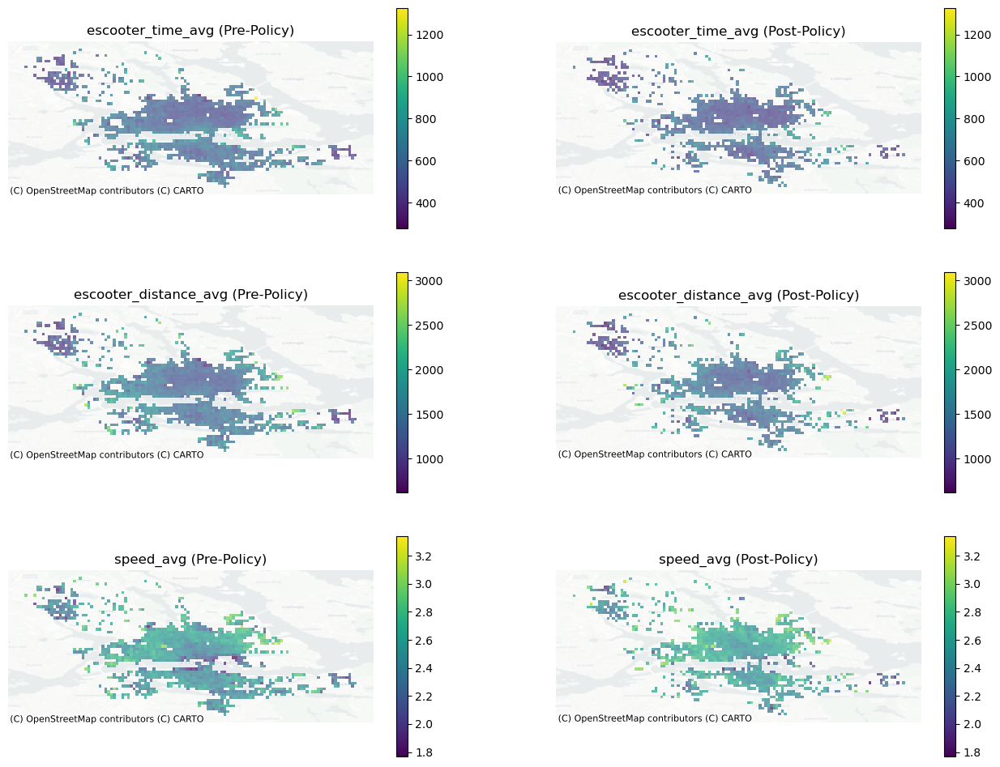

,escooter_time_avg,escooter_distance_avg,speed_avg
measure,,,
t-statistic,12.3206,3.1885,-15.9340
p_ttest,0.0000,0.0015,0.0000
mean_ant,597.5074,1486.0936,2.5205
mean_post,561.7899,1452.7089,2.6020
std_ant,110.7333,314.1837,0.2255
std_post,107.9245,325.5355,0.2124


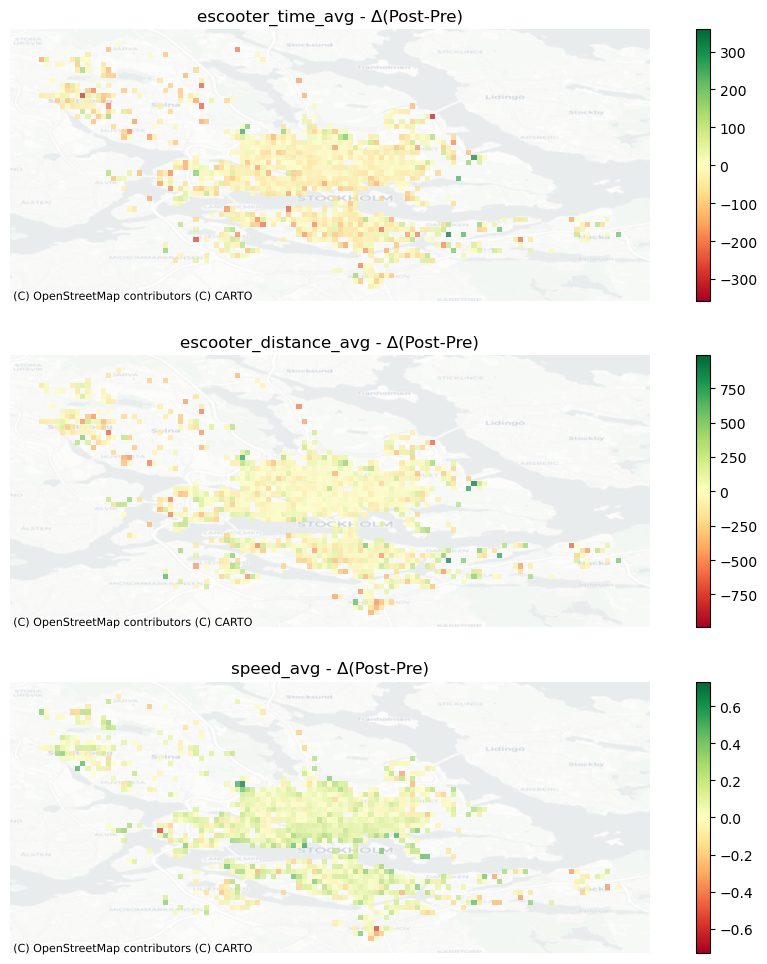

In [152]:
dims = ['escooter_time_avg','escooter_distance_avg', 'speed_avg']

a,b = plot_before_after_az(dims)
plt.show()

ttest_traveltime = paired_ttest_az(dims)
display(ttest_traveltime.round(4))

a, b = plot_differences_az(dims)
plt.show()

# Usage Efficiency

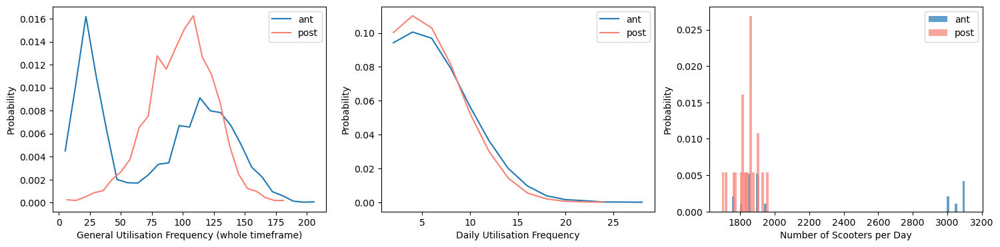

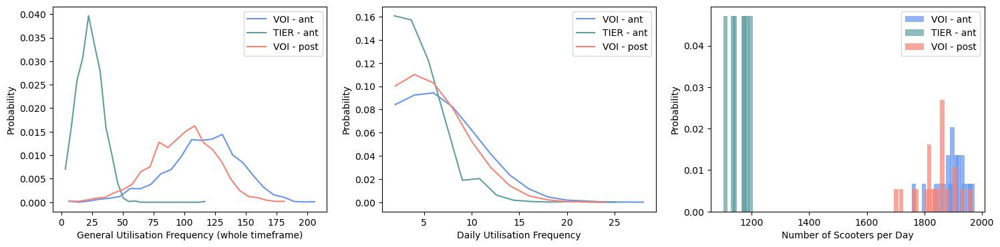

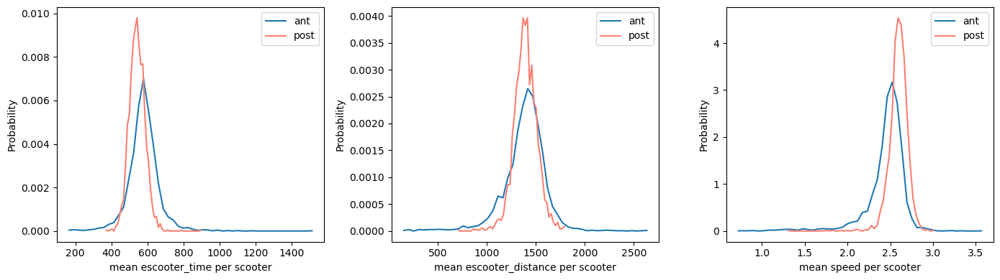

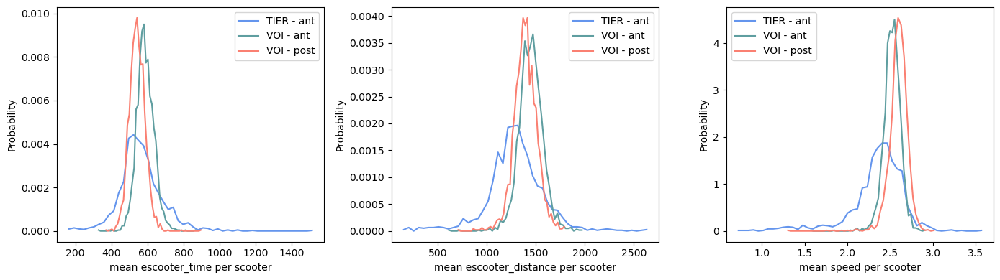

,duration,distance,speed,daily_util,total_util
measure,,,,,
t-statistic,17.8940,-1.8209,-27.6724,18.4042,-17.6161
p_ttest,0.0000,0.0687,0.0000,0.0000,0.0000
mean_ant,577.6933,1382.9357,2.4520,6.2233,78.1645
mean_post,542.7638,1392.0527,2.5961,5.7533,98.6407
std_ant,86.2534,219.3601,0.2333,3.8998,51.1472
std_post,43.7208,118.2233,0.1052,3.5101,26.7370


In [177]:
fig, axes = plt.subplots(1, 3, figsize=(18, 4))

# overall utilisation rate
plot_count_before = np.histogram(data_before.groupby(['id']).o_time.count(), 25, density=True)
plot_count_after = np.histogram(data_after.groupby(['id']).o_time.count(), 25, density=True)

plot_count_before_l =(plot_count_before[1][1:] + plot_count_before[1][:-1])/2
plot_count_after_l =(plot_count_after[1][1:] + plot_count_after[1][:-1])/2

axes[0].plot(plot_count_before_l, plot_count_before[0], label = 'ant')
axes[0].plot(plot_count_after_l, plot_count_after[0], label = 'post', color='salmon')
axes[0].set_ylabel('Probability')
axes[0].set_xlabel('General Utilisation Frequency (whole timeframe)')
axes[0].legend()

# daily utilisation rate
plot_count_before = np.histogram(data_before.groupby(['Date', 'id']).size().reset_index()[0], 14, density=True)
plot_count_after = np.histogram(data_after.groupby(['Date', 'id']).size().reset_index()[0], 12, density=True)

plot_count_before_l =(plot_count_before[1][1:] + plot_count_before[1][:-1])/2
plot_count_after_l =(plot_count_after[1][1:] + plot_count_after[1][:-1])/2

axes[1].plot(plot_count_before_l, plot_count_before[0], label = 'ant')
axes[1].plot(plot_count_after_l, plot_count_after[0], label = 'post', color='salmon')
axes[1].set_ylabel('Probability')
axes[1].set_xlabel('Daily Utilisation Frequency')
axes[1].legend()

axes[2].hist(data_before.groupby(['Date']).id.nunique(),bins=30, label='ant', density=True, width=15, alpha=0.7)
axes[2].hist(data_after.groupby(['Date']).id.nunique(),bins=30, label='post', color='salmon', density=True, width=15, alpha=0.7)
axes[2].set_ylabel('Probability')
axes[2].set_xlabel('Number of Scooters per Day')
axes[2].legend()

################## separate TIER & VOI

fig, axes = plt.subplots(1, 3, figsize=(18, 4))

# overall utilisation rate
plot_count_before = np.histogram(data_before[data_before.type=='vio'].groupby(['id']).o_time.count(), 25, density=True)
plot_count_tier = np.histogram(data_before_tier.groupby(['id']).o_time.count(), 25, density=True)
plot_count_after = np.histogram(data_after.groupby(['id']).o_time.count(), 25, density=True)

plot_count_before_l =(plot_count_before[1][1:] + plot_count_before[1][:-1])/2
plot_count_before_l_tier =(plot_count_tier[1][1:] + plot_count_tier[1][:-1])/2
plot_count_after_l =(plot_count_after[1][1:] + plot_count_after[1][:-1])/2

axes[0].plot(plot_count_before_l, plot_count_before[0], label = 'VOI - ant', color='cornflowerblue')
axes[0].plot(plot_count_before_l_tier, plot_count_tier[0], label = 'TIER - ant', color='cadetblue')
axes[0].plot(plot_count_after_l, plot_count_after[0], label = 'VOI - post', color='salmon')
axes[0].set_ylabel('Probability')
axes[0].set_xlabel('General Utilisation Frequency (whole timeframe)')
axes[0].legend()

# daily utilisation rate
plot_count_before = np.histogram(data_before[data_before.type=='vio'].groupby(['Date', 'id']).size().reset_index()[0], 14, density=True)
plot_count_before_tier = np.histogram(data_before_tier.groupby(['Date', 'id']).size().reset_index()[0], 14, density=True)
plot_count_after = np.histogram(data_after.groupby(['Date', 'id']).size().reset_index()[0], 12, density=True)

plot_count_before_l =(plot_count_before[1][1:] + plot_count_before[1][:-1])/2
plot_count_before_l_tier =(plot_count_before_tier[1][1:] + plot_count_before_tier[1][:-1])/2
plot_count_after_l =(plot_count_after[1][1:] + plot_count_after[1][:-1])/2

axes[1].plot(plot_count_before_l, plot_count_before[0], label = 'VOI - ant', color='cornflowerblue')
axes[1].plot(plot_count_before_l_tier, plot_count_before_tier[0], label = 'TIER - ant', color='cadetblue')
axes[1].plot(plot_count_after_l, plot_count_after[0], label = 'VOI - post', color='salmon')
axes[1].set_ylabel('Probability')
axes[1].set_xlabel('Daily Utilisation Frequency')
axes[1].legend()

axes[2].hist(data_before[data_before.type=='vio'].groupby(['Date']).id.nunique(),bins=30, density=True, width=15, alpha=0.7, label = 'VOI - ant', color='cornflowerblue')
axes[2].hist(data_before_tier.groupby(['Date']).id.nunique(),bins=30, density=True, width=15, alpha=0.7, label = 'TIER - ant', color='cadetblue')
axes[2].hist(data_after.groupby(['Date']).id.nunique(),bins=30, label='VOI - post', color='salmon', density=True, width=15, alpha=0.7)
axes[2].set_ylabel('Probability')
axes[2].set_xlabel('Number of Scooters per Day')
axes[2].legend()

fig, axes = plt.subplots(1, 3, figsize=(14, 4))

dims = ['escooter_time', 'escooter_distance', 'speed']

for i, e in enumerate(dims):
    plot_dim_before = np.histogram(data_before.groupby(['id'])[e].mean(), 50, density=True)
    plot_dim_after = np.histogram(data_after.groupby(['id'])[e].mean(), 50, density=True)
    
    plot_dim_before_l =(plot_dim_before[1][1:] + plot_dim_before[1][:-1])/2
    plot_dim_after_l =(plot_dim_after[1][1:] + plot_dim_after[1][:-1])/2

    axes[i].plot(plot_dim_before_l, plot_dim_before[0], label = 'ant')
    axes[i].plot(plot_dim_after_l, plot_dim_after[0], label = 'post', color='salmon')
    axes[i].set_xlabel('mean ' + e + ' per scooter')
    axes[i].set_ylabel('Probability')
    axes[i].legend()

plt.tight_layout()
plt.show()

fig, axes = plt.subplots(1, 3, figsize=(14, 4))

dims = ['escooter_time', 'escooter_distance', 'speed']

for i, e in enumerate(dims):
    # average distance, time and speed per scooter
    plot_dim_before = np.histogram(data_before_tier.groupby(['id'])[e].mean(), 50, density=True)
    plot_dim_after = np.histogram(data_before[data_before.type=='vio'].groupby(['id'])[e].mean(), 50, density=True)
    plot_dim_after_voi = np.histogram(data_after.groupby(['id'])[e].mean(), 50, density=True)

    plot_dim_before_l =(plot_dim_before[1][1:] + plot_dim_before[1][:-1])/2
    plot_dim_after_l =(plot_dim_after[1][1:] + plot_dim_after[1][:-1])/2
    plot_dim_after_l_voi =(plot_dim_after_voi[1][1:] + plot_dim_after_voi[1][:-1])/2

    axes[i].plot(plot_dim_before_l, plot_dim_before[0], label = 'TIER - ant', color='cornflowerblue')
    axes[i].plot(plot_dim_after_l, plot_dim_after[0], label = 'VOI - ant', color='cadetblue')
    axes[i].plot(plot_dim_after_l_voi, plot_dim_after_voi[0], label = 'VOI - post', color='salmon')
    axes[i].set_xlabel('mean ' + e + ' per scooter')
    axes[i].set_ylabel('Probability')
    axes[i].legend()

plt.tight_layout()
plt.show()


# Overview table
df_ttest = pd.DataFrame(columns=['escooter_time', 'escooter_distance', 'speed', 'daily_util', 'total_util'])
df_ttest['measure'] = ['t-statistic', 'p_ttest']
df_ttest.set_index('measure', inplace=True)

dims=['escooter_time', 'escooter_distance', 'speed']

for i in dims:
    avg_dis_per_scoo_b = data_before.groupby(['id'])[i].mean().to_frame().reset_index()
    avg_dis_per_scoo_a = data_after.groupby(['id'])[i].mean().to_frame().reset_index()

    #Unpaired
    temp_ttest = stats.ttest_ind(a=data_before.groupby(['id'])[i].mean(), b=data_after.groupby(['id'])[i].mean(), equal_var=True)
    df_ttest[i] = [temp_ttest.statistic, temp_ttest.pvalue]

  
temp_ttest = stats.ttest_ind(a=data_before.groupby(['Date', 'id']).size().reset_index()[0], b=data_after.groupby(['Date', 'id']).size().reset_index()[0], equal_var=True)
df_ttest['daily_util'] = [temp_ttest.statistic, temp_ttest.pvalue]

temp_ttest = stats.ttest_ind(a=data_before.groupby(['id']).o_time.count(), b=data_after.groupby(['id']).o_time.count(), equal_var=True)
df_ttest['total_util'] = [temp_ttest.statistic, temp_ttest.pvalue]

# Mean and standard deviation of quantities, before and after
df_ttest.loc['mean_ant'] = data_before.groupby(['id'])[dims].mean().mean()
df_ttest.loc['mean_post'] = data_after.groupby(['id'])[dims].mean().mean()
df_ttest.loc['std_ant'] = data_before.groupby(['id'])[dims].mean().std()
df_ttest.loc['std_post'] = data_after.groupby(['id'])[dims].mean().std()

df_ttest = df_ttest.rename(columns={'escooter_distance':'distance', 'escooter_time':'duration'})


scooter_t_stats = pd.DataFrame(columns=['anterior','posterior'])
mean_count_b = data_before['id'].to_frame().assign(c=1).groupby(['id']).sum().reset_index()['c']
mean_count_a = data_after['id'].to_frame().assign(c=1).groupby(['id']).sum().reset_index()['c']
df_ttest.loc['mean_ant', 'daily_util'] = data_before.groupby(['Date', 'id']).size().reset_index()[0].mean()
df_ttest.loc['mean_post', 'daily_util'] = data_after.groupby(['Date', 'id']).size().reset_index()[0].mean()
df_ttest.loc['std_ant', 'daily_util'] = data_before.groupby(['Date', 'id']).size().reset_index()[0].std()
df_ttest.loc['std_post', 'daily_util'] = data_after.groupby(['Date', 'id']).size().reset_index()[0].std()
df_ttest.loc['mean_ant', 'total_util'] = data_before.groupby(['id']).o_time.count().mean()
df_ttest.loc['mean_post', 'total_util'] = data_after.groupby(['id']).o_time.count().mean()
df_ttest.loc['std_ant', 'total_util'] = data_before.groupby(['id']).o_time.count().std()
df_ttest.loc['std_post', 'total_util'] = data_after.groupby(['id']).o_time.count().std()
display(df_ttest)
pd.options.display.float_format = '{:.4f}'.format


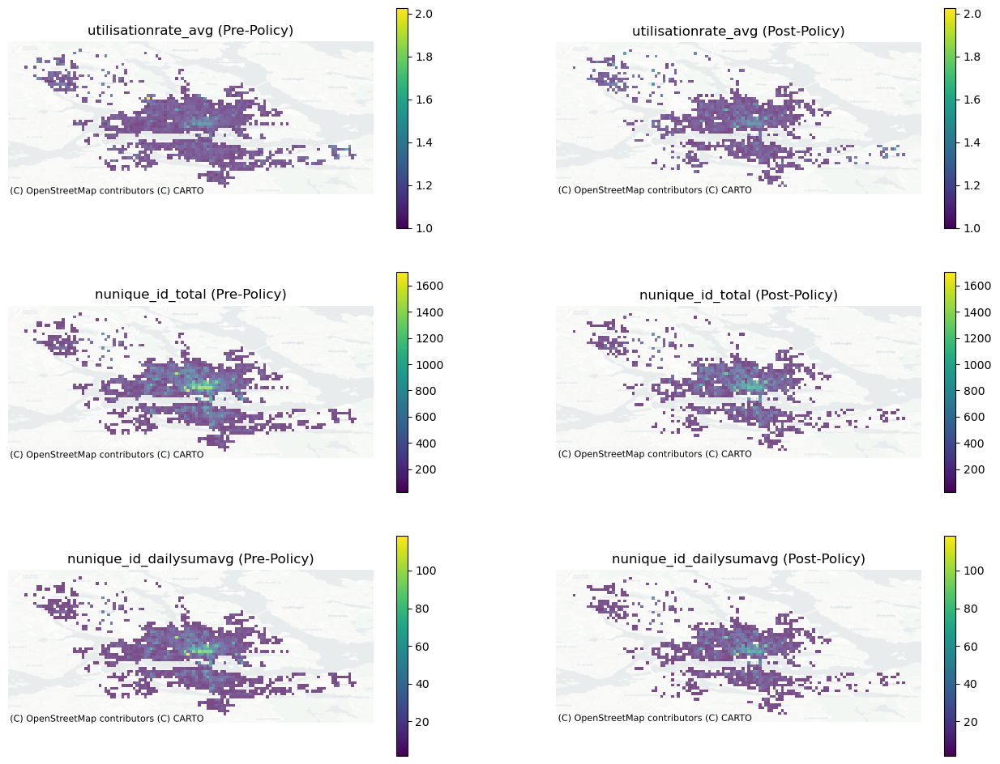

,utilisationrate_avg,nunique_id_total,nunique_id_dailysumavg
measure,,,
t-statistic,1.4020,17.3353,15.4717
p_ttest,0.1612,0.0000,0.0000
mean_ant,1.0894,205.7098,11.0085
mean_post,1.0938,184.8967,9.9896
std_ant,0.0765,222.4407,13.0308
std_post,0.0813,184.3200,11.1355


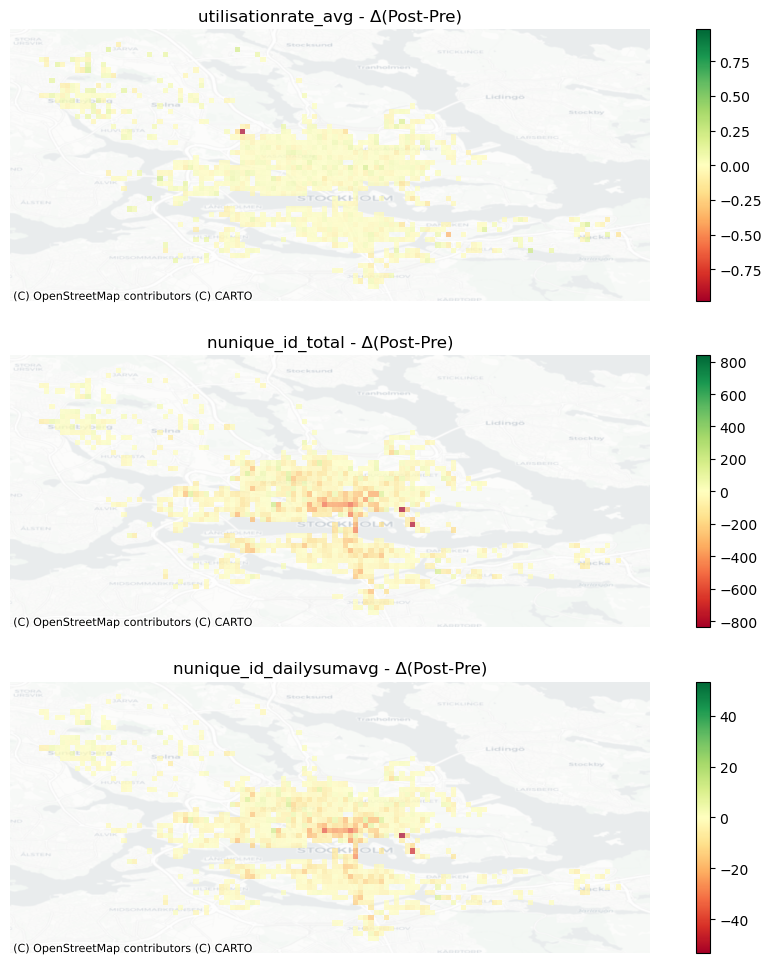

In [158]:
dims=['utilisationrate_avg' , 'nunique_id_total' , 'nunique_id_dailysumavg']
a,b = plot_before_after_az(dims)
plt.show()

ttest_ghg = paired_ttest_az(dims)
display(ttest_ghg)

a, b = plot_differences_az(dims)
plt.show()

# GHG Emission Reduction

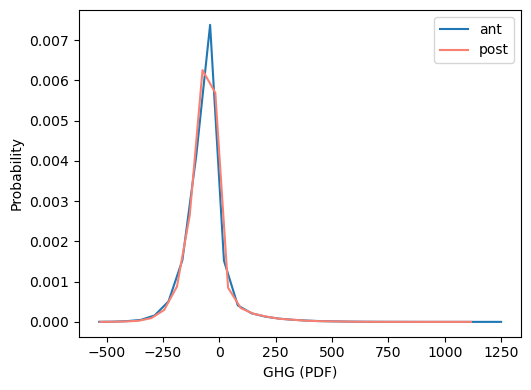

,GHG
measure,
t-statistic,-6.1987
p_ttest,0.0000
mean_ant,-58.7335
mean_post,-57.2198
std_ant,88.7089
std_post,84.7734


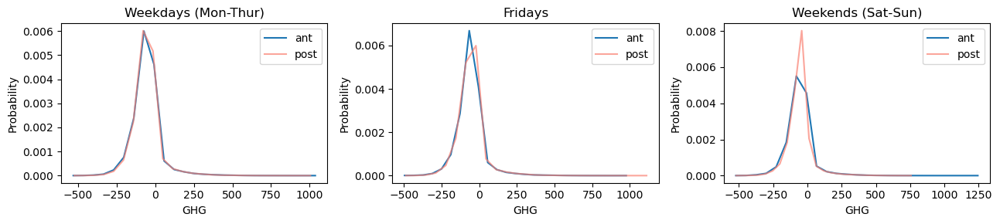

,GHG
measure,
t-statistic,-3.666182
p_ttest,0.000246
mean_ant,-58.754251
mean_post,-57.578748
std_ant,88.921387
std_post,85.110705
,GHG
measure,
t-statistic,-3.351009


In [175]:
fig, axes = plt.subplots(1,2, figsize=(10,4))

freq_plots_columns = ['GHG']
arr_log = [0]

for i, e in enumerate(freq_plots_columns):

    plot_dim_before_l, plot_dim_after_l, plot_dim_before, plot_dim_after = histogram_lines(e, 30)
        
    axes[i].plot(plot_dim_before_l, plot_dim_before[0], label = 'ant')
    axes[i].plot(plot_dim_after_l, plot_dim_after[0], label = 'post', color='salmon')
    axes[i].set_xlabel(e+' (PDF)' + (' (log)' if arr_log[i] == 1 else ''))
    axes[i].set_ylabel('Probability')
    axes[i].legend()

plt.delaxes(axes[1])
plt.tight_layout()
plt.show()

display(reg_ttest(freq_plots_columns, arr_log).round(4))

dims = ['GHG']
log_arr = [0,0]
pdf_day_mode_plot(dims, log_arr, 25)
dims = ['GHG']
ttest_day_mode(dims, log_arr)

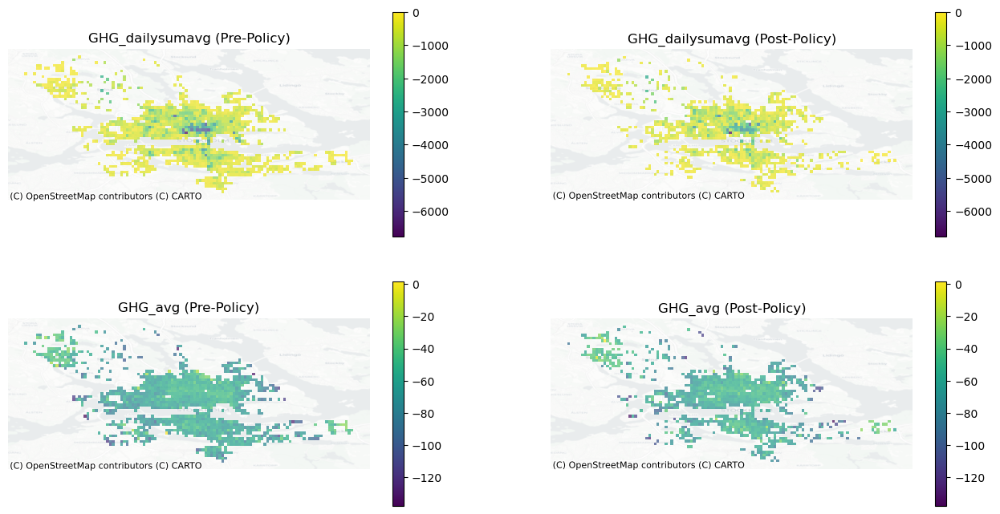

,GHG_dailysumavg,GHG_avg
measure,,
t-statistic,-15.7388,-2.7987
p_ttest,0.0000,0.0052
mean_ant,-667.0774,-60.8879
mean_post,-587.4252,-59.3565
std_ant,774.3528,15.6732
std_post,643.7623,16.3782


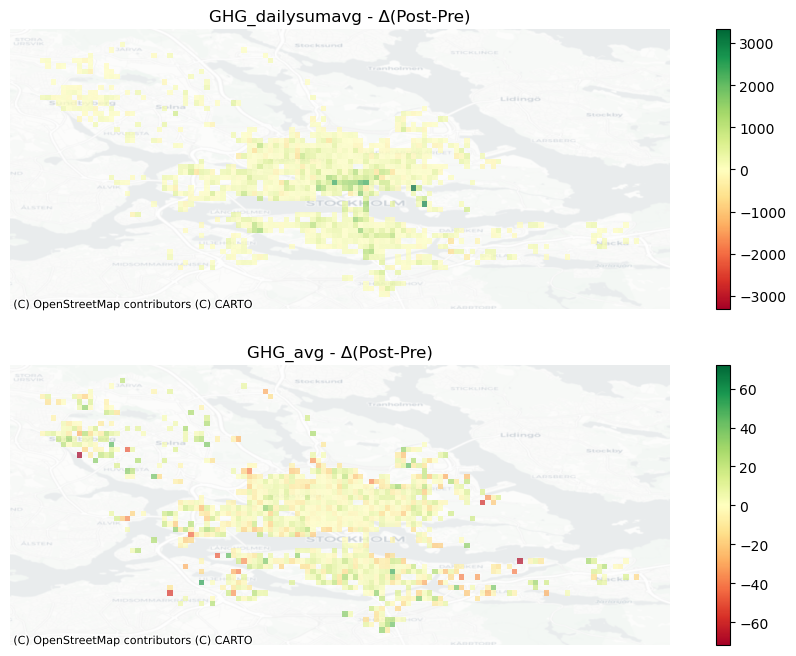

In [163]:
dims = ['GHG_dailysumavg', 'GHG_avg']
a,b = plot_before_after_az(dims)
plt.show()
ttest_ghg = paired_ttest_az(dims)
display(ttest_ghg)

a, b = plot_differences_az(dims)
plt.show()

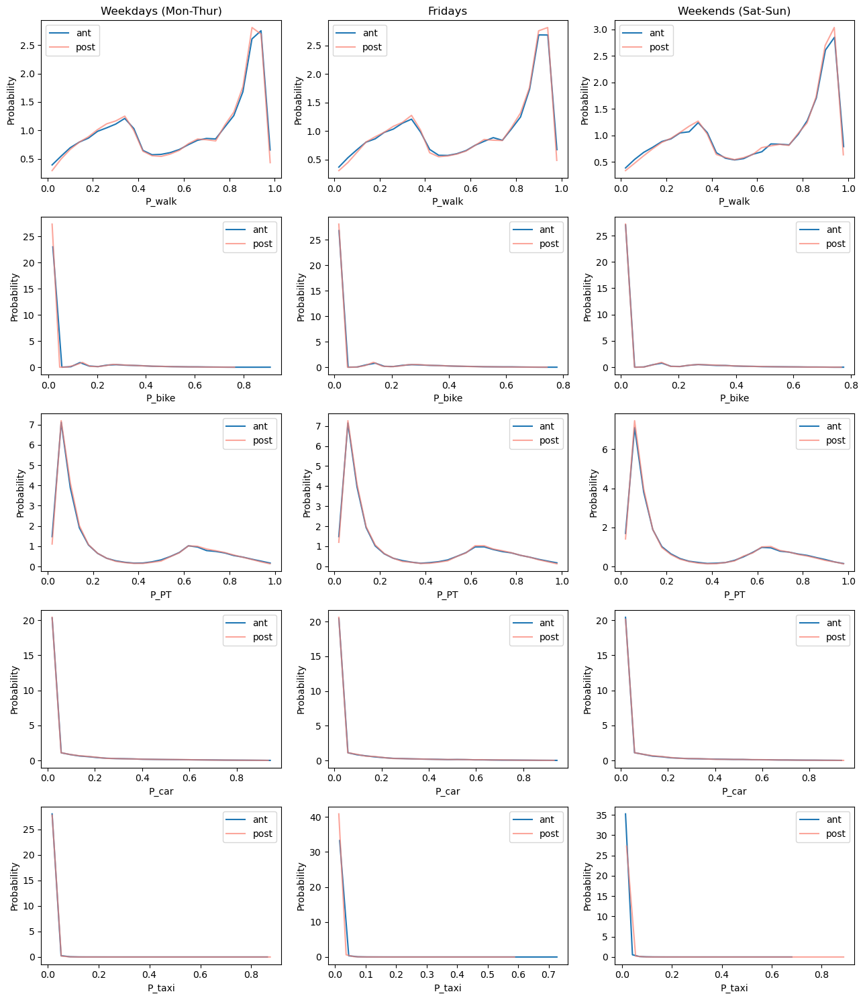

,P_walk,P_bike,P_PT,P_car,P_taxi
measure,,,,,
t-statistic,-1.551314,0.332621,-0.327999,-0.505637,6.761893
p_ttest,0.120827,0.739420,0.742913,0.613112,0.000000
mean_ant,0.585055,0.042194,0.288264,0.053012,0.005160
mean_post,0.586733,0.042054,0.288613,0.053262,0.004899
std_ant,0.295962,0.115381,0.290312,0.134822,0.011353
std_post,0.292986,0.113877,0.288511,0.133700,0.009164
,P_walk,P_bike,P_PT,P_car,P_taxi
measure,,,,,
t-statistic,-1.393056,0.626680,0.005533,-1.191199,1.523253


In [164]:
dims = ['P_walk', 'P_bike', 'P_PT', 'P_car', 'P_taxi']
log_arr = [0,0,0,0,0,0,0]
pdf_day_mode_plot(dims, log_arr, 25)
ttest_day_mode(dims, log_arr)

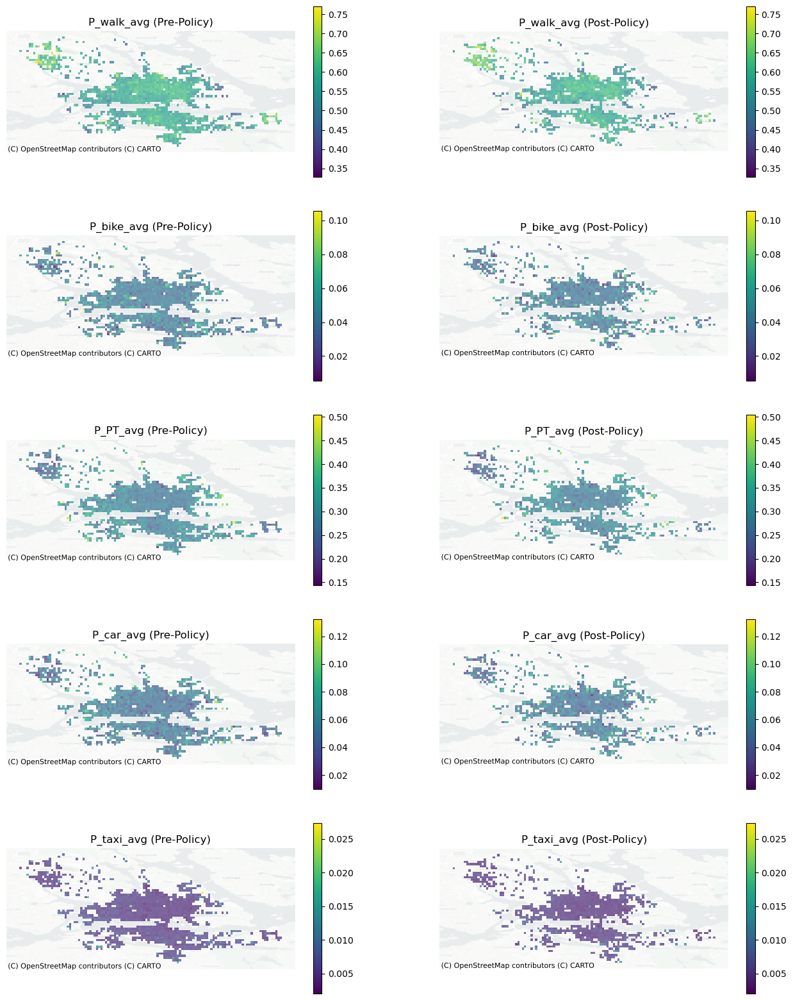

,P_walk_avg,P_bike_avg,P_PT_avg,P_car_avg,P_taxi_avg
measure,,,,,
t-statistic,-0.1345,-0.9404,0.1447,-1.8832,5.0083
p_ttest,0.8930,0.3472,0.8850,0.0600,0.0000
mean_ant,0.5819,0.0427,0.2922,0.0539,0.0056
mean_post,0.5830,0.0430,0.2909,0.0548,0.0052
std_ant,0.0504,0.0121,0.0413,0.0154,0.0019
std_post,0.0538,0.0124,0.0418,0.0150,0.0015


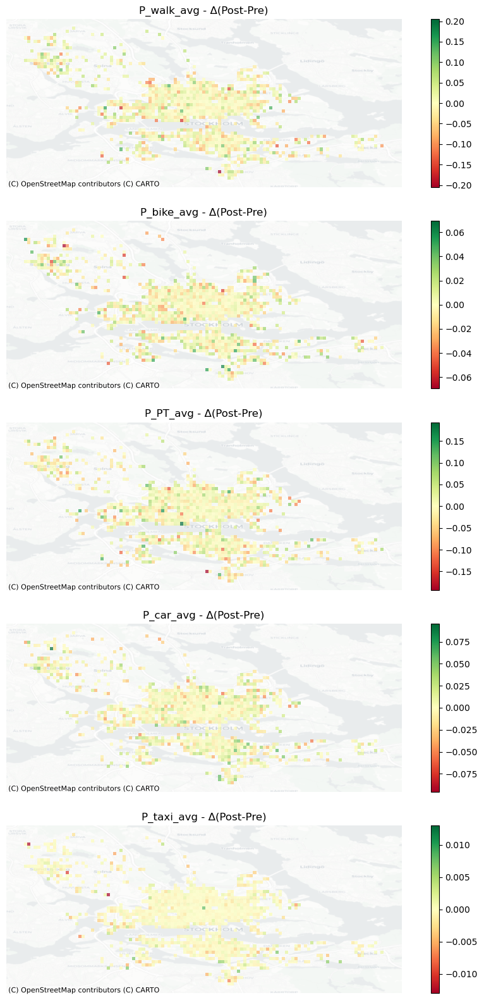

In [166]:
dims = ['P_walk_avg', 'P_bike_avg', 'P_PT_avg', 'P_car_avg', 'P_taxi_avg']
a,b = plot_before_after_az(dims)
plt.show()

ttest_ghg = paired_ttest_az(dims)
display(ttest_ghg)

a, b = plot_differences_az(dims)
plt.show()

## Reduced Travel Time

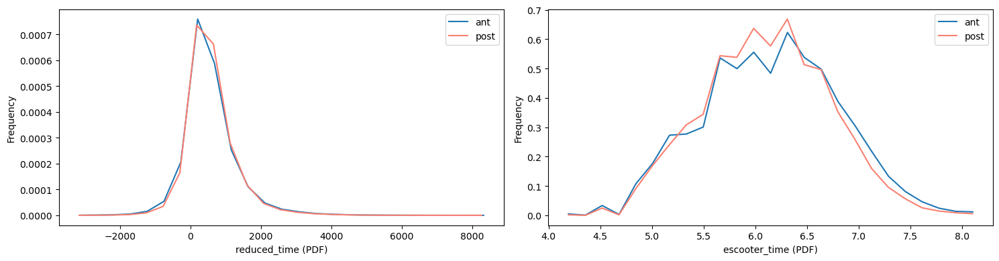

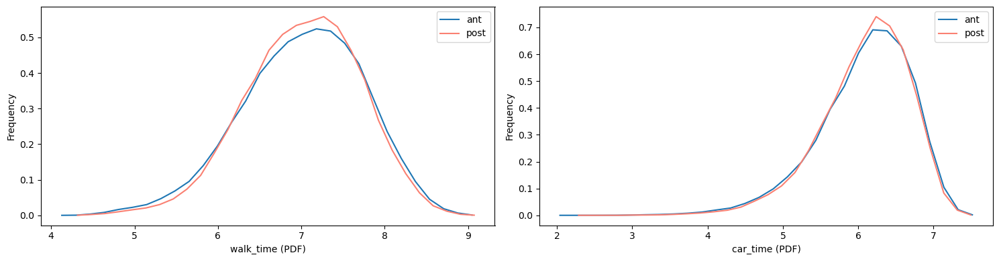

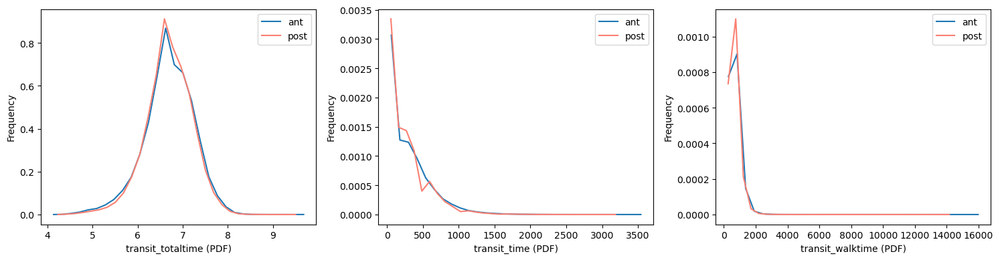

,reduced_time,escooter_time,walk_time,car_time,transit_totaltime,transit_time,transit_walktime
measure,,,,,,,
t-statistic,-8.7139,24.9397,-1.7586,-3.0292,-0.2354,8.6566,8.5282
p-value,0.0000,0.0000,0.0786,0.0025,0.8139,0.0000,0.0000
mean_ant,562.0423,583.9136,1427.1016,517.4702,925.4377,266.3724,659.0653
mean_post,580.4360,542.7868,1394.6131,512.7702,910.3376,259.2545,651.0831
std_ant,739.8277,412.8818,1013.9964,274.5126,503.9858,298.5332,343.5401
std_post,681.9098,358.7943,947.0151,262.6613,466.9108,285.3818,319.5493


In [168]:
fig, axes = plt.subplots(1, 2, figsize=(15, 4))
arr = ['reduced_time','escooter_time']

for i,e in enumerate(arr):
    
    if i == 0:
        plot_dim_before_l, plot_dim_after_l, a, b = histogram_lines(e, 25)
    else:
        plot_dim_before_l, plot_dim_after_l, a, b = histogram_lines_log(e, 25)

    axes[i].plot(plot_dim_before_l, a[0], label = 'ant')
    axes[i].plot(plot_dim_after_l, b[0], label = 'post', color='salmon')
    axes[i].set_xlabel(e+' (PDF)')
    axes[i].set_ylabel('Frequency')
    axes[i].legend()

plt.tight_layout()
plt.show()


fig, axes = plt.subplots(1, 2, figsize=(15, 4))
arr = ['walk_time', 'car_time']

for i,e in enumerate(arr):
    
    plot_dim_before_l, plot_dim_after_l, a, b = histogram_lines_log(e, 30)

    axes[i].plot(plot_dim_before_l, a[0], label = 'ant')
    axes[i].plot(plot_dim_after_l, b[0], label = 'post', color='salmon')
    axes[i].set_xlabel(e+' (PDF)')
    axes[i].set_ylabel('Frequency')
    axes[i].legend()

plt.tight_layout()
plt.show()

fig, axes = plt.subplots(1, 3, figsize=(15, 4))
arr = ['transit_totaltime', 'transit_time', 'transit_walktime']

for i,e in enumerate(arr):
    
    if i==0:
        plot_dim_before_l, plot_dim_after_l, a, b = histogram_lines_log(e, 30)
    else:
        plot_dim_before_l, plot_dim_after_l, a, b = histogram_lines(e, 30)

    axes[i].plot(plot_dim_before_l, a[0], label = 'ant')
    axes[i].plot(plot_dim_after_l, b[0], label = 'post', color='salmon')
    axes[i].set_xlabel(e+' (PDF)')
    axes[i].set_ylabel('Frequency')
    axes[i].legend()

plt.tight_layout()
plt.show()


arr = ['reduced_time','escooter_time','walk_time', 'car_time','transit_totaltime','transit_time', 'transit_walktime']
ghg_ttest = pd.DataFrame(columns=arr)
ghg_ttest['measure'] = ['t-statistic', 'p-value']
ghg_ttest.set_index('measure', inplace=True)

temp = stats.ttest_ind(data_before['reduced_time'].dropna(), data_after['reduced_time'].dropna(), equal_var=True) 
ghg_ttest['reduced_time'] = [temp.statistic, temp.pvalue]

temp = stats.ttest_ind(np.log(data_before['escooter_time'].dropna()), np.log(data_after['escooter_time'].dropna()), equal_var=True) 
ghg_ttest['escooter_time'] = [temp.statistic, temp.pvalue]

temp = stats.ttest_ind(np.log(data_before['walk_time'].dropna()), np.log(data_after['walk_time'].dropna()), equal_var=True) 
ghg_ttest['walk_time'] = [temp.statistic, temp.pvalue]

temp = stats.ttest_ind(np.log(data_before['car_time'].dropna()), np.log(data_after['car_time'].dropna()), equal_var=True) 
ghg_ttest['car_time'] = [temp.statistic, temp.pvalue]

temp = stats.ttest_ind(np.log(data_before['transit_totaltime'].dropna()), np.log(data_after['transit_totaltime'].dropna()), equal_var=True) 
ghg_ttest['transit_totaltime'] = [temp.statistic, temp.pvalue]

temp = stats.ttest_ind(data_before['transit_time'].dropna(),data_after['transit_time'].dropna(), equal_var=True) 
ghg_ttest['transit_time'] = [temp.statistic, temp.pvalue]

temp = stats.ttest_ind(data_before['transit_walktime'].dropna(), data_after['transit_walktime'].dropna(), equal_var=True) 
ghg_ttest['transit_walktime'] = [temp.statistic, temp.pvalue]
    

# Mean and standard deviation of quantities, before and after
ghg_ttest.loc['mean_ant'] = data_before[arr].describe().loc['mean']
ghg_ttest.loc['mean_post'] = data_after[arr].describe().loc['mean']
ghg_ttest.loc['std_ant'] = data_before[arr].describe().loc['std']
ghg_ttest.loc['std_post'] = data_after[arr].describe().loc['std']
    
display(ghg_ttest)  

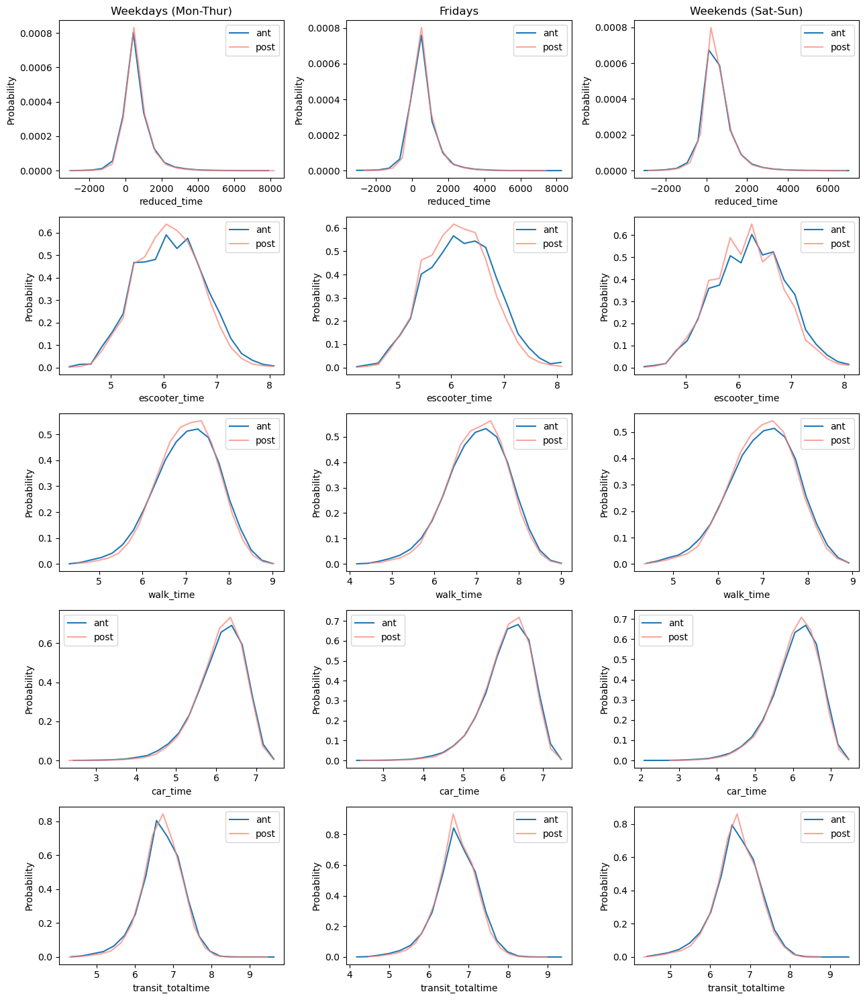

,reduced_time,escooter_time,walk_time,car_time,transit_totaltime
measure,,,,,
t-statistic,-4.292879,13.666620,-2.159811,-4.016729,-2.172563
p_ttest,0.000018,0.000000,0.030788,0.000059,0.029814
mean_ant,588.905436,561.396195,1436.546374,519.790639,925.465965
mean_post,600.640105,527.416168,1402.971533,516.178463,913.485043
std_ant,734.512517,389.790924,1017.095793,274.162238,496.682240
std_post,668.446635,339.225699,943.652445,261.404413,461.571850
,reduced_time,escooter_time,walk_time,car_time,transit_totaltime
measure,,,,,
t-statistic,-7.963588,18.494997,-0.485742,0.738518,3.324674


In [169]:
dims = ['reduced_time','escooter_time','walk_time', 'car_time','transit_totaltime']
log_arr = [0,1,1,1,1,0,0]
pdf_day_mode_plot(dims, log_arr, 20)
ttest_day_mode(dims, log_arr)

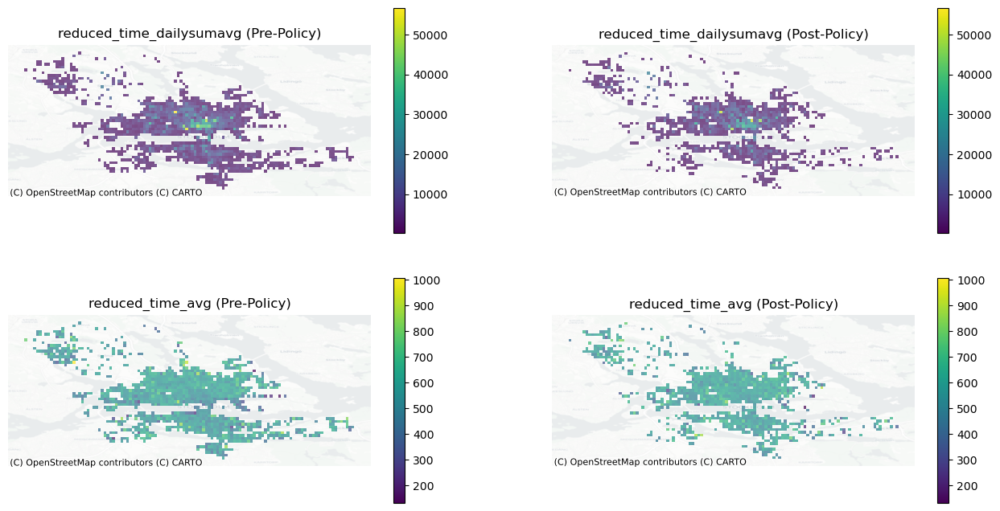

,reduced_time_dailysumavg,reduced_time_avg
measure,,
t-statistic,14.5433,-3.1836
p_ttest,0.0000,0.0015
mean_ant,5754.0054,567.2991
mean_post,5411.4580,579.6811
std_ant,6518.9104,97.9726
std_post,5997.2003,85.8398


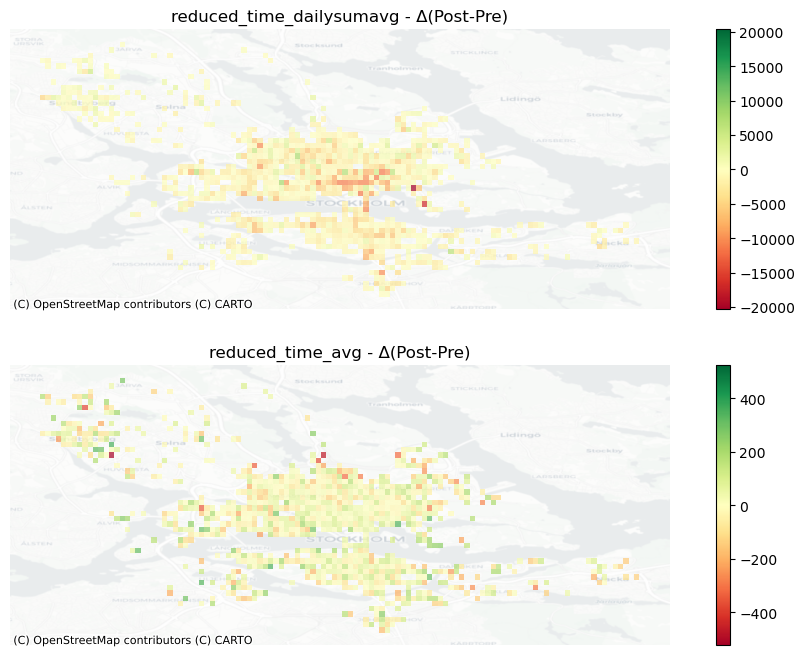

In [171]:
dims = ['reduced_time_dailysumavg','reduced_time_avg']

a,b = plot_before_after_az(dims)
plt.show()

ttest_traveltime = paired_ttest_az(dims)
display(ttest_traveltime)

a, b = plot_differences_az(dims)
plt.show()

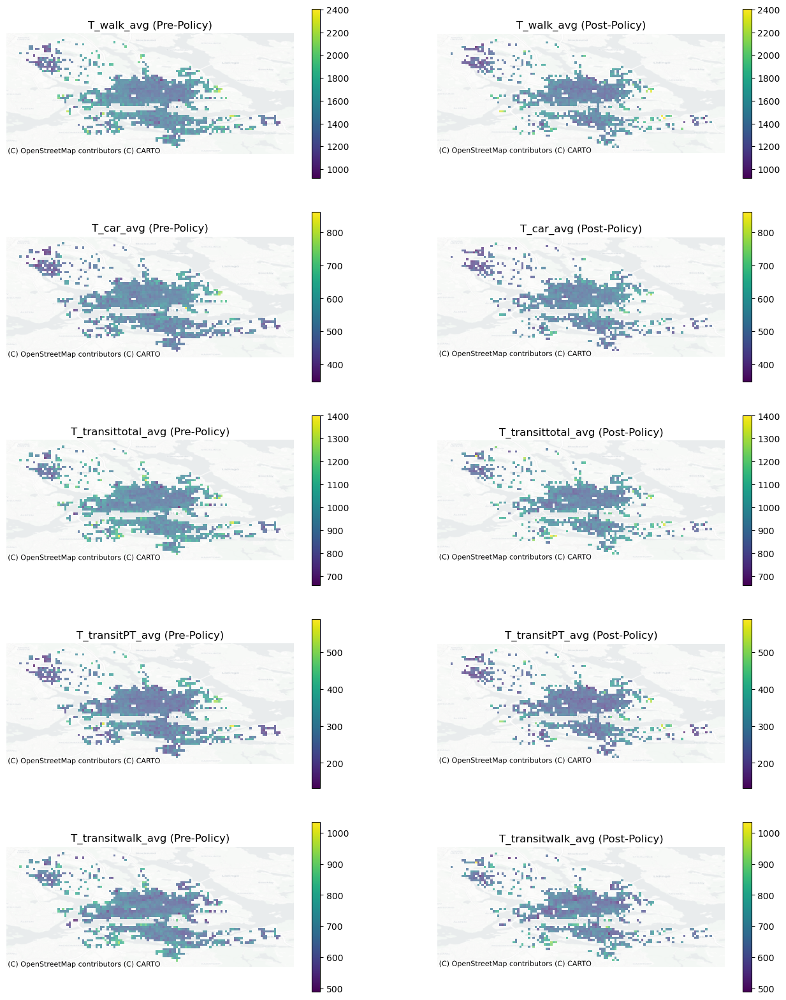

,T_walk_avg,T_car_avg,T_transittotal_avg,T_transitPT_avg,T_transitwalk_avg
measure,,,,,
t-statistic,4.7263,1.0572,4.0428,3.5218,2.9856
p_ttest,0.0000,0.2907,0.0001,0.0004,0.0029
mean_ant,1465.0869,518.2694,950.3344,276.8378,673.4966
mean_post,1429.7993,515.1897,935.2720,269.3376,665.9344
std_ant,189.7183,53.9582,94.1698,57.2760,64.9378
std_post,193.5147,54.9655,96.8989,58.4249,64.5873


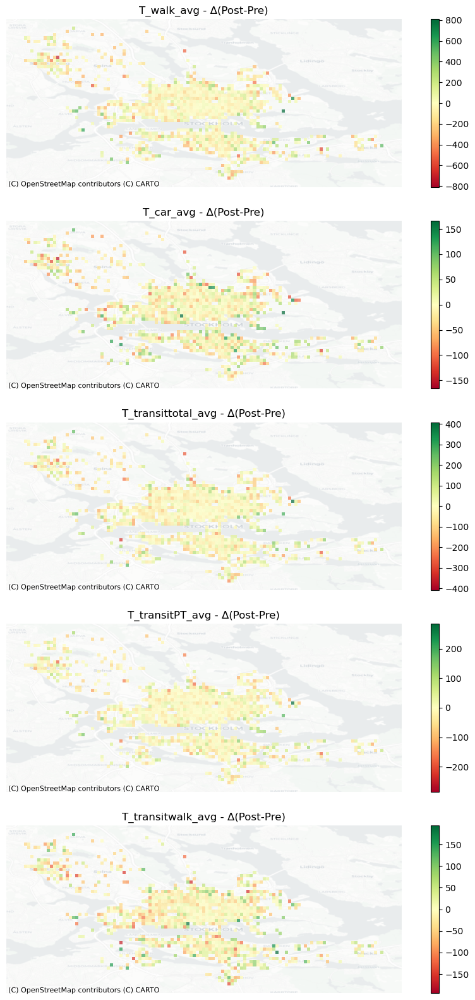

In [172]:
dims=['T_walk_avg', 'T_car_avg', 'T_transittotal_avg', 'T_transitPT_avg','T_transitwalk_avg']
a,b = plot_before_after_az(dims)
plt.show()

ttest_ghg = paired_ttest_az(dims)
display(ttest_ghg)

a, b = plot_differences_az(dims)
plt.show()